In [1]:
# How to use transformers

In [2]:
# Sentiment analysis using transformers 
# Embedding and nearest neigbour search 
# Named entity recognition
# TExt generation
# Masked language modelling
# Text summarization
# language translation
# Question-answering[ input=(question,context), Answer = selection from context (usually the input is just one string but here it will be 2 strings)]
# Zero shot classification [example:- we can do spam detection without actually training the model to do spam detection]

In [4]:
# How we got from RNN to transformers and attention
# Main Points 
# The attention mechanism allows neural networks to learn very long range dependencies in sequence [This tells us how chatgpt is able to retain on what points we talked to it on]
# Attention was created for RNN, but transformers use attention only while doing away with the recurrent path
# Transformers are big and slow
# but unlike rnns[lstm and gru] where the sequential computation is done for forward feed of the network, here in transformers the computations can be done in parallel

Overview 

In a Recurrent Neural Network (RNN), the data is fed forward through the network one time step at a time. At each time step, the RNN takes an input, performs computations on it using a set of weights, and produces an output. The output is then fed back into the network as the input for the next time step.

The process of feeding input data forward through a neural network is called "forward propagation" or "forward pass". In the case of an RNN, forward propagation is done one time step at a time, with each time step producing an output that is used as input for the next time step.

The computations performed by an RNN at each time step involve a combination of the current input and the previous hidden state of the network. The hidden state is updated at each time step and serves as a memory of the previous inputs that have been processed by the network. This allows the RNN to capture temporal dependencies in the input data and make predictions based on the context of previous inputs.

In summary, an RNN performs forward feeding by processing input data one time step at a time, updating its hidden state at each time step, and producing an output that is fed back into the network for the next time step.

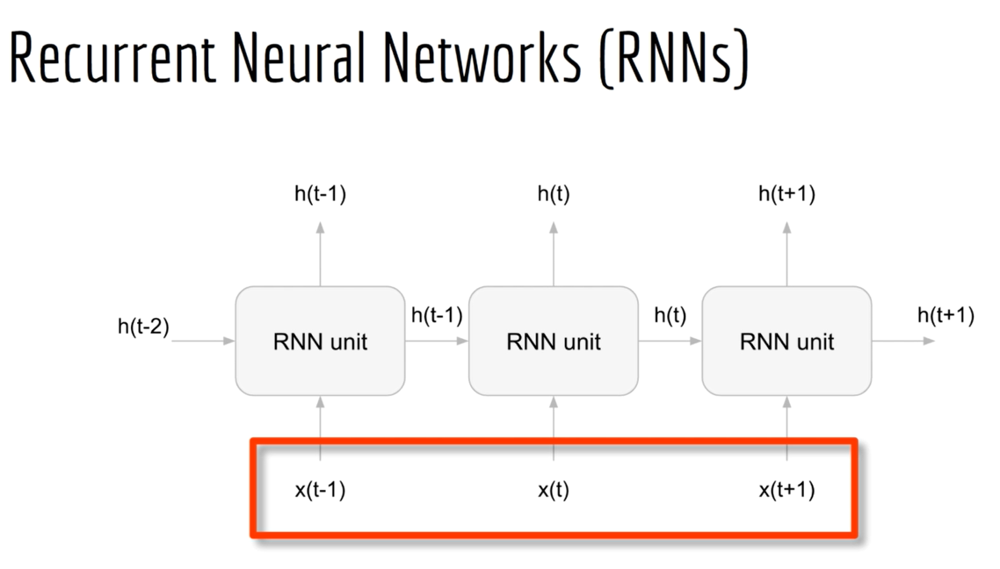

In [1]:
# Types of task 
# many to one task ['spam detection']: - Final output is typically computed from a final hidden state that we achieved 
# and using this final state we can determine the probablity of the given text as spam or not 
# Many to many task ['parts of speech tagging']: - basically means [1 like dogs will be pronoun-verb-noun] 3 for 3
# this basically means that we keep all the hidden states and use all of these sattes to compute an output.

Consider language translation[problems]
1. input sequence length will may not be equal target sequence length as in another language one word may translate to multiple words or vice versa
2. The predictions at time t only depends on all the inputs that were given to it and therefore the above mentioned methods will not work, order can be mixed up in different language.

Solution to this problem 
1. Sequence to sequence :- Having 2 rnns 1 called the encoder and second called the decoder.

In the image below we see that the encoders don't have the dense layer for their output but instead they give the output as a thought vector which is just the hidden layer compressed vector and then we move towards the decorder which takes that hidden output and a starting argument named Go for processing the output and the predicted word from the decoder is used as the input for the next rnn and when we are done the ecoder produces an END token.
 

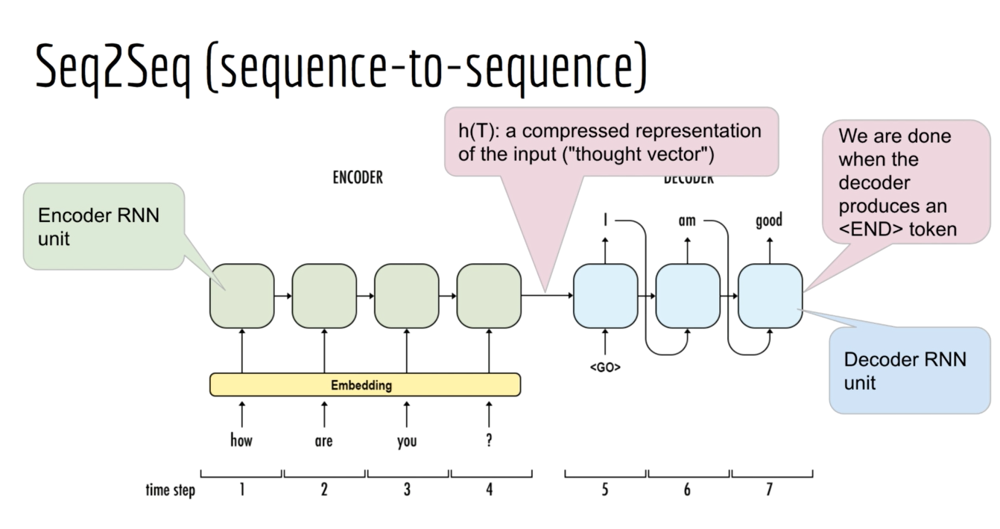

Problem with SEQ2SEQ 
If the input is long then the final encoder state always has the same size and has to remeber the whole input.
IN addition Rnn are not very good at remebering the inputs over long sentences.

So, originally attention was developed for seq2seq [for rnns] 

In this we take, two Rnn networks one of which is for forward encoder that takes in the account of the input words and the second rnn that takes in account of the context of the sentence through backward propagation.

In Seq2seq we draw the dencoder on the top row and for the enocder we use the bidirectional rnn and in this way we keep in account for the all the words in forward direction and we also take in the context vector that is basically that we know which word comes after the word and which word comes before the word.
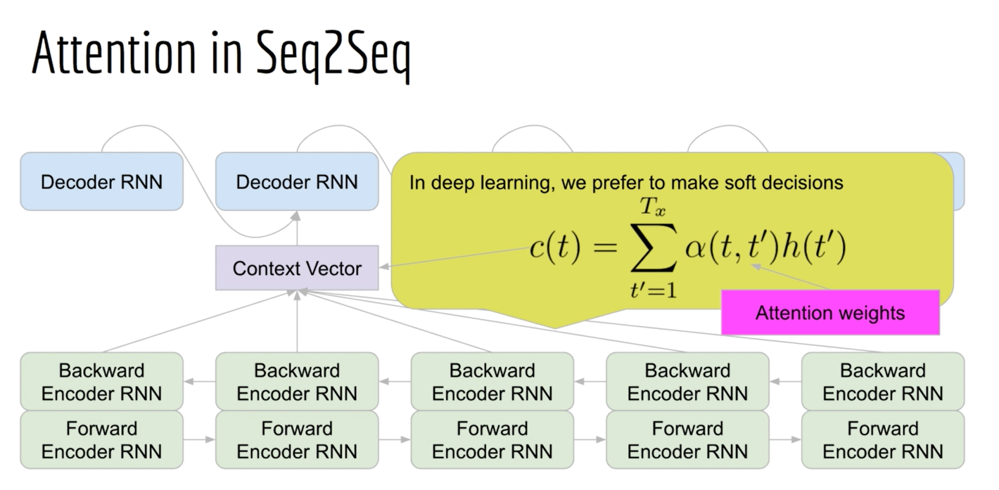


For the decoder we generate output as 1 word at a time using the past word we generate as the input to the new word, but in this we also take in account of the context vector we generated.
INTUITION :- we would like to know for which of the tx time steps the ty should pay attention too, 

Our goal is to pich the ht' to pick the best words based of corresponding weights and then feed to the decoder by concatinating the answer with  context so that we get a single vector
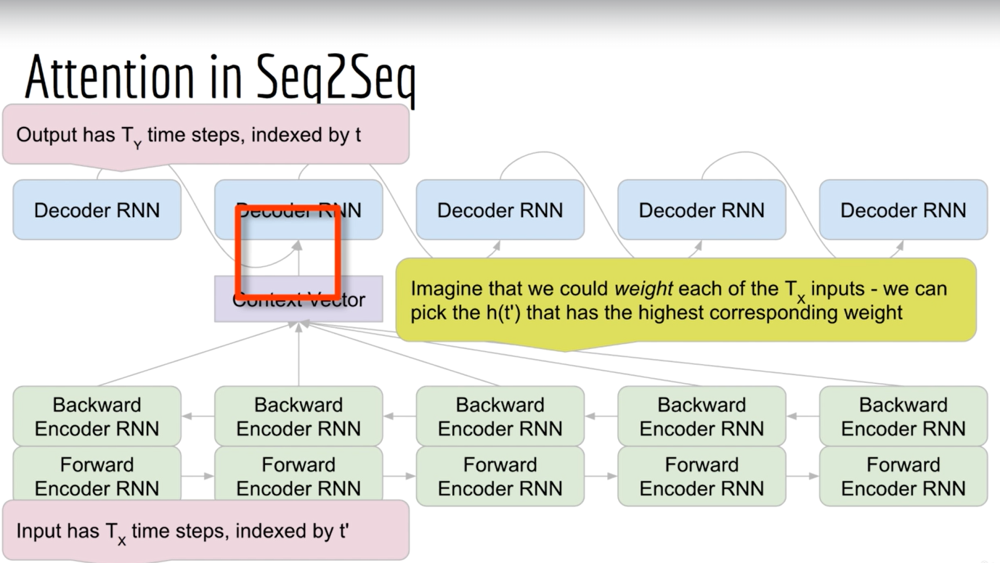

INstead of taking the single ht' but we take a weighted sum of all the hidden states, the key here is that every hidden state from the encoder will influence every input state of the decorder, through weights we call attention weights. We will call the attention state as alpha(t,t') which is a number that represent thata number at  timestep t should pay attention to the number at timestep t', in this case the context vector is the weighted sum of the h(t's) with the alpha's. we ahve weights from everyu input to every output, which tell us how much each output should pay attention to each input.


Interpretting attention weights: -

It is better to plot attention weights to know why a model is predicting what output. In the case of translation it allow us to see how each word was found and which word it was paying attention too.
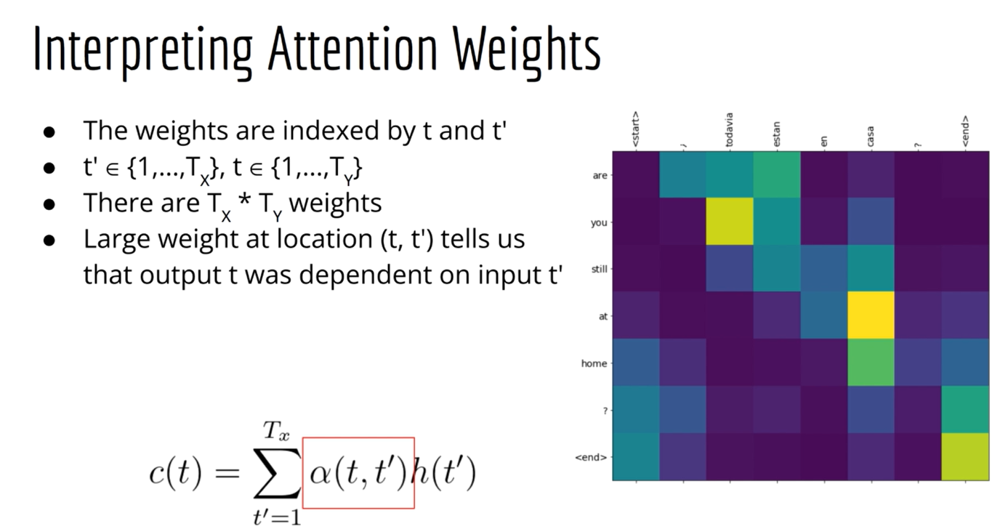

Paper :- Attention is all you need.

The whole paper tells us that Forget about the Rnn and its attention that you need. By doing this we still get the most important feature of the our model, which is that everyoutput knows which input to pay attention too

Attention : For each output token we want to know which input token to pay attention to.


Drawbacks of using Rnn's: -

Firstly, learnings are slow because every output must be computed sequentially from the previous output.
There is simply no way around this and you cannot parallelize this operation since the previous value
must be known before you compute the next value.

Second drwaback is the concept of the vanishing gradient, although modern Rnn's namely LSTM and GRU, does an okay job but to a certain point. LStm stops performing well after a point.

BUt with attention mechanism there exist a direct connection between every input and every output, and we can perform the calculations in parallel.

The only downside is that the attention mechanism is inheritly quadratic, basically it means that for input/output length N, we have O(N^2) weights

The way the attention works for transformers is a bit different than the way it works for rnn. 

So what is a transformer?

At a very high level.
A transformer is just a stack of attention layers that repeatedly perform this and squared computation to figure out which parts of the input to pay attention to. And this is the intuition behind Transformers.

# Discussing The Attention is all you need paper

The authors of this paper were more focused on NLP and were telling us to get rid of the RNN's.

let's say: - we want to convert this sentence to german language.

The Cat eats the mouse.

We will encode this sentence to represenattion and then decode it again and somehow(THis is discussed above on how we are using the seq2seq for translation) this sentence goes into one vector and then we decode this sentence into the target language and they were solved so far using LSTM's.
Word vector:-Word vectors are generated based on the context in which words appear in a given text corpus. The algorithm used to generate the word vectors typically takes into account the co-occurrence statistics of words, which means it looks at which words tend to appear in close proximity to each other in the corpus. By analyzing these patterns, the algorithm can learn to represent each word as a vector in a high-dimensional space, where words with similar meanings or usage patterns are located close to each other.

Once the word vectors are generated, they can be used to perform a variety of NLP tasks such as text classification, sentiment analysis, and machine translation. In these tasks, the word vectors are often used as input to machine learning algorithms, which use the vectors to learn patterns in the text data and make predictions based on those patterns.

So, lets assume we are taking the word 'The' from the above example, We turnn this word vector into a hidden state using neural network and then we take second token 'cat' and we use word vector on this and we turn this into a hidden state and and using the neural network and the output from the previous state and we get another hiddent state, basically taking a word and converting it to the word vector, then to a hidden state using neural network and using that as input for the next state.
and we use the last hidden state to use as an input to the decoder which will give us a word and it will also give us the next hidden state. 

So encoder will take an input and a hidden state and compute a new hidden state and in case of decoder, they will take the hidden state from the encoder and previus word from the output and then gives a new word.

# Attention[only an over view]

The attention mechanism allow the decoder to basically go back and look at particular part of the input, so basically the attention mechanism allows the decoder to specifically look at the previous step to know which inpu parameter it needs to focus itself on.

The path length to goto 'eats' to convert it into another language is much shorter where as to go back in the traditional Rnn, and that where the attention comes in.

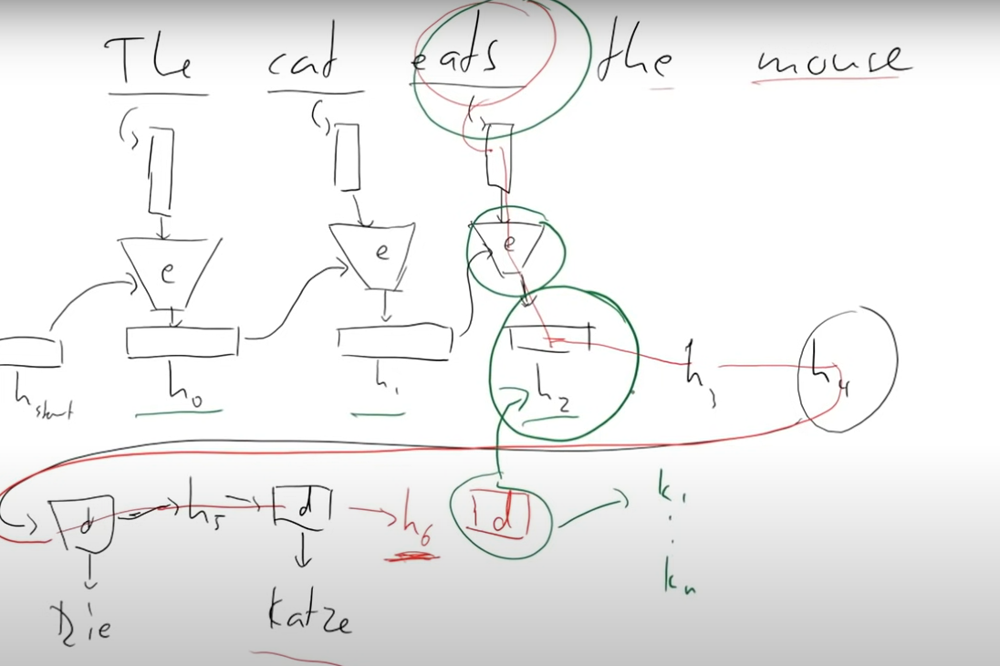

The decoder will output some of the keys and these keys would index the hidden states and via kind of the softmax. The decoder
can decide to attend to the input sentences and draw information from there, instead of having to go to just to the hidden state its provided with.

The paper introduces us with the transformer architecture.[Not an Rnn]

Transformer architecture:- Has two parts encoder and decorder but its not same as rnn in any case as the computation is done all at one go like the whole sentence at one go.

Source sentence go to input embedding part and the target sentence goes to output embediing part and at the end we get the proabilities and that tells us about the probablities of the next word and repeat again the entire step.So basically every step in production is one training sample. But in Rnn entire sentence to sentence translation is one sample, and we need to backpropogate, because they all happen kind of in seqeunce.
Here the ouput of one single token is one sample and then the computation is finished the backdrop happens through everything only for this one step, there is no multistep kind of backpropogation and this is a kind of paradigm shift in sequence processing because people were always convinced, that we need this kind of recurrence things in order to learn, the dependencies in the data, but the paper told us to only use attention and everything will be done in one step.

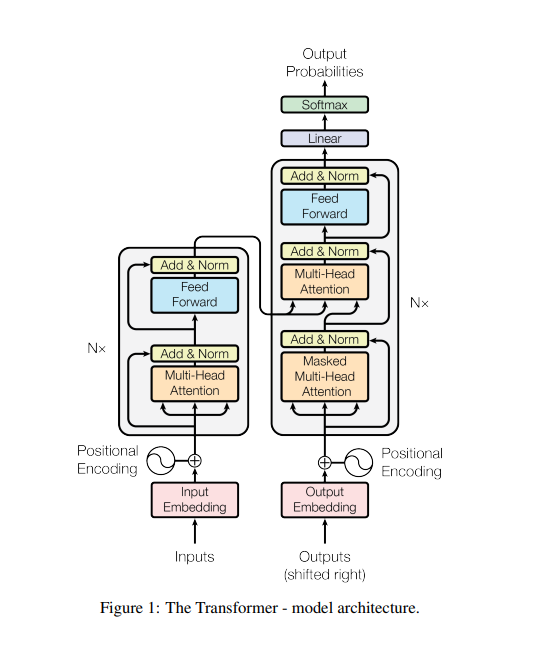

Discussing the model:
INput and output embedding arfe symmetrical, basically just embedding the given words and then there is positional embedding, that tells the network where the words are located like in the beginning or at the end, and this is done with trignometric functioning embeddings. Binary way of encoding a position.

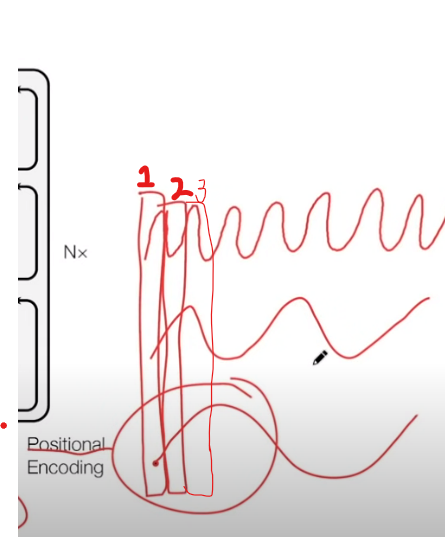

Like we see here in the image that waves that represent trignometric function are used to encode words based on their frequency and 1,2,3 tells us the word positions. SO if I want to compare between words than I can just look at all of these scales, basically if one word is on high but the other word is on low then they are pretty far away.If they happen to match in the waves like on the crest of the wave and in the second wave also they are located in the same side i.e in the crest of the wave then we can say that they are close enough to each other.

In the diagrma we see like 3 times the attention is called upon. 
SO in teh input embedding we provide it with the hidden state that basically comes from the given sentence and we kind of like pick and choose which word we look at and to the right side of the network[output embedding] the ouput words that we have produced so far are encoded into kind of a hidden state and the top right is the most interesting attention where it combines the encoder part with the decoder part of the source sentence with the target sentence that you have produced so far, 
we can observe that there is an output that is going from the input part to the output multi head attention part.We see tow connection from input embedding and one from output embedding. 

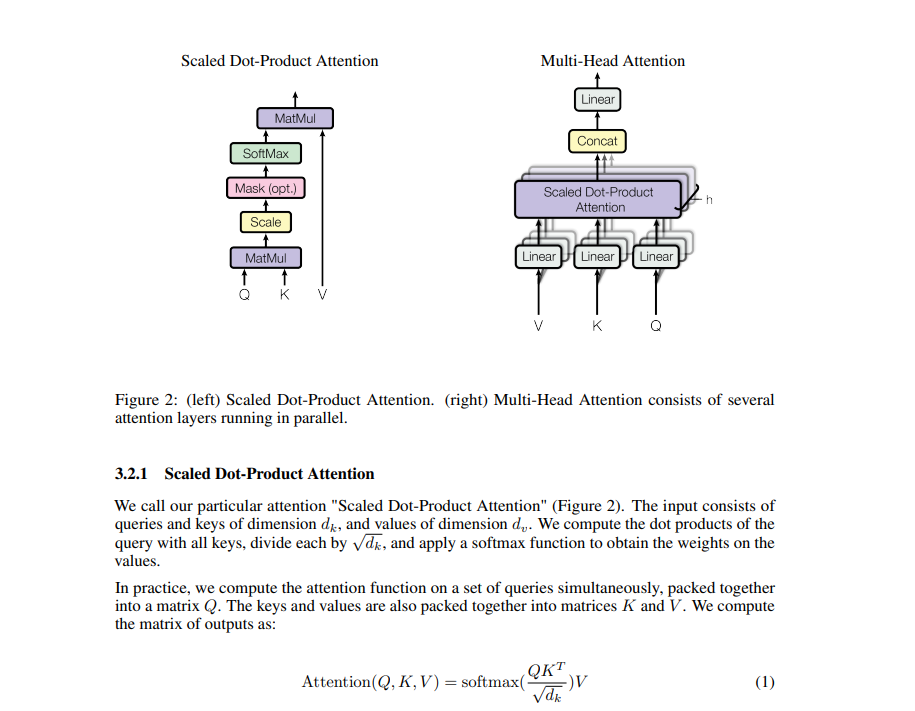

{ A little bit about the soft max activation function , it will make the outputs to be in a range of 0 to 1 with all the probablilities adding upto 1 softmax funxtion: - e^x/sum(e^xi)} where i ranges from 1 to n.

V refers to values, K refers to keys and Q refers to queries  that are bieng passed in the multi head attention. The dot product of the vector(q.k) basically gives you the angle between the vector, in high dimesional, most of the vectors are not going to align well[90 degrees, and cos 90 is 0] and their dot products will be 0, but if two vectors are in the same direction then their dot product will be large. The generated keys are just a bunch of vectors in the space and each key has associated values(Hash map). Then after all of this we will generate a query and then we will compute the dot product with each of the keys in the query and then we compute a softmax and the query that will have the biggest dot product will be selected. 


So we can see in the image below is that a softmax function is computed and which we will multiply with the list of values, that are given to us by the prompt and then we are going to compute the distance between the vectors
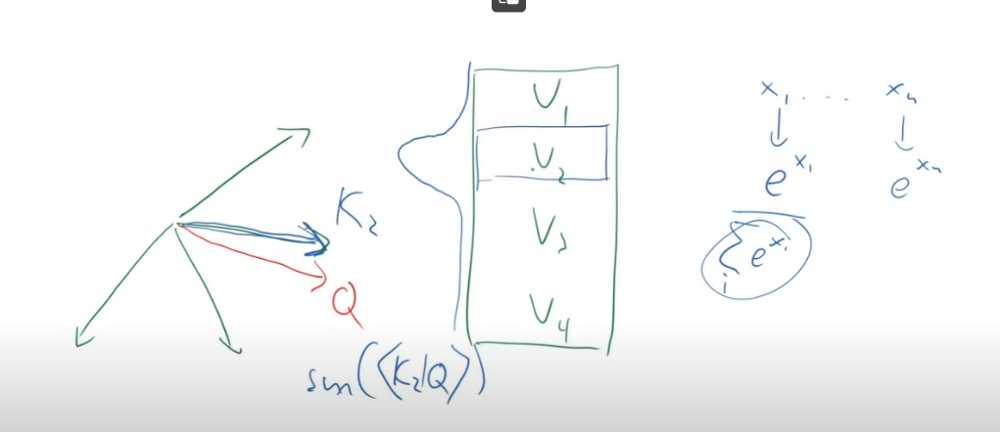

Input embedding discovers the important features of the given sentence and then computes the key value pairs and then the output embedding provide us with the queries and together they give us the next signal, so basically the input network says that there are a bunch of things that you may find interesting and the keys are how you would address these keys. and then output embedding part build the queries[what I would like to know ]. 

Attention mechanism reduces the paths lemgth comparitively than RNn's


# Transformers model in depth, based on Attention is all you need paper






Single LSTM was used in the sequence to sequence encoder and decoder, the encoder generates a hidden state from the given test and then the hidden state is creates and is passed to the decoder, which will then produce an output.
Attention models help us to to get to know the dependencies and then we do need to care about the distance between the input and output sequences.
Since RNN's were slow and they need to process the data sequence by sequence,we needed a new way to make use of attention models and that was was by the use of transformers.

While RNNs have been widely used in natural language processing tasks, such as language modeling, machine translation, and speech recognition, they do have certain limitations. One of the main limitations of RNNs is that they have difficulty in capturing long-term dependencies in sequential data due to the vanishing gradient problem. This can make it difficult for RNNs to effectively model relationships between distant elements in a sequence.

Additionally, RNNs are inherently sequential models, which can make them slow to train and difficult to parallelize. This is because each time step in an RNN depends on the previous time step, so the computations cannot be easily parallelized across different time steps.

Transformers were introduced as an alternative to RNNs for natural language processing tasks. They use a self-attention mechanism to capture relationships between different elements in a sequence, allowing them to better capture long-term dependencies. Additionally, transformers can be more easily parallelized than RNNs, as the computations for each element in the sequence can be processed independently in parallel. This makes transformers faster to train and more computationally efficient than RNNs for certain tasks.


An attention model is a neural network architecture that allows a model to selectively focus on different parts of the input sequence when making predictions. The idea behind attention is to allow the model to selectively attend to different parts of the input sequence based on their relevance to the task at hand. 

In an attention model, the input sequence is first passed through an encoder network, such as an RNN or a transformer, to generate a set of encoder states. These encoder states capture information about the input sequence and are used as the basis for computing attention weights.

The attention mechanism works by computing a set of attention weights that determine how much each encoder state should contribute to the final prediction. These attention weights are computed based on a similarity function between a query vector and each encoder state. The query vector is typically a learned parameter that is updated during training.

Once the attention weights are computed, a weighted sum of the encoder states is taken to generate the context vector, which is used as input to the decoder network. The decoder network then generates the output sequence based on the context vector and the previous output.

The attention mechanism allows the model to selectively attend to different parts of the input sequence based on the relevance to the output sequence. This can result in better performance on tasks such as machine translation, where the input and output sequences have complex relationships that can be difficult to capture with a fixed-length representation.


# Word embeddings 

General Idea behind word to vector format.
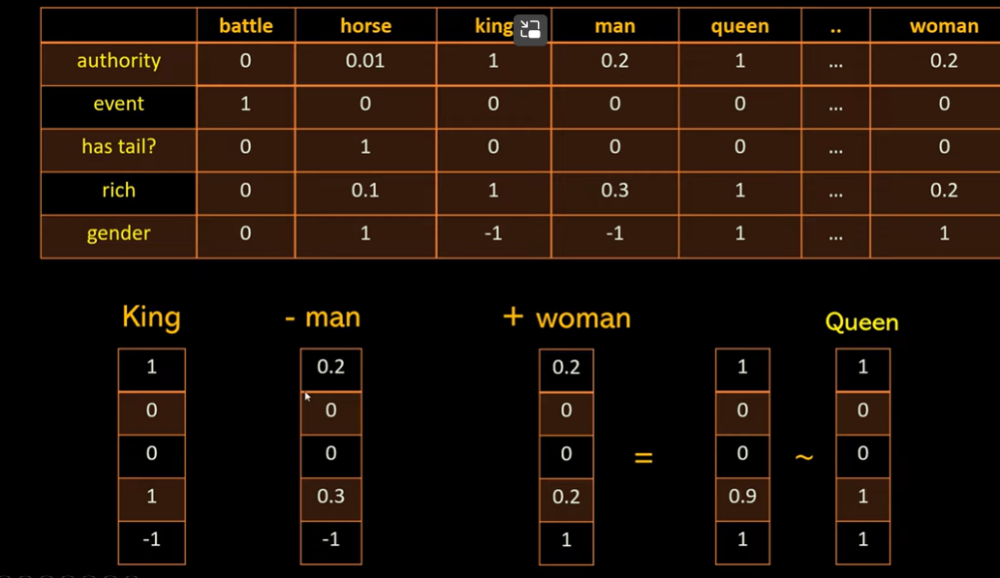

Assumption:- Word embeddings look for simialrity of words based on the fact if they are used in the same context.
A little bit about vectors before we go further in detail about the transformers.

one hot encoding of vectors, it basically means giving the word value of one for each unique word in a vector, this approach is not a very good approach as it gives out words without any context of the given text and as it doesn't take acoount for that.

We have to train our neural network in such a way that it can take in account of the similarity of the words that appear together or in similar context by converting words to vector.

For Example:- coding is great, is in positive context while my phone broke! great is in neagtive context of the word great. So it becomes necessayr to take in account of when to use the word great in positive eay and in negative way, SO that's why we assign them more than 1 number like one word be given an array of numbers to account for its context as well.

1st we take into account of how many unique words we got for the task at hand.

<span style="background-color: yellow;">The number of activation functions we use correspond to how many number we want to associate with each word and the weights of those connection would be the numbers we want to associate with each words.</span>

Lets take an example:- Troll2  is great and Gymkata is great as two sentences, then we see we have 4 unique words in these sentences and then we make them pass through an activation function here, that just allows us to perform addition here.
So we will make use of two activation functions and that will allow us to give two numbers each to a word.

Troll 2[1.activation function gives it a value of 0.38, and the 2nd activation function gives a value of 0.42]
is[-0.12,0.46]
great[-0.11,0.10]
Gymkata[-0.24,0.29]

based of these numbers given to us by the activation functions we can even plot them on the graph 
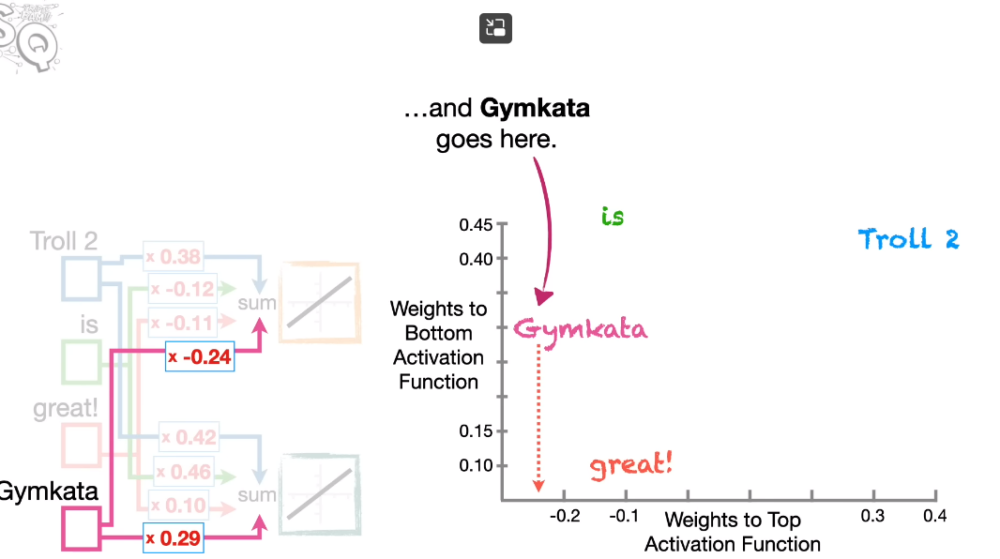

observing these graphs we say that troll2 and gymkata are not similar words but because of backpropogation and adjsutment of weights we will make them similar.

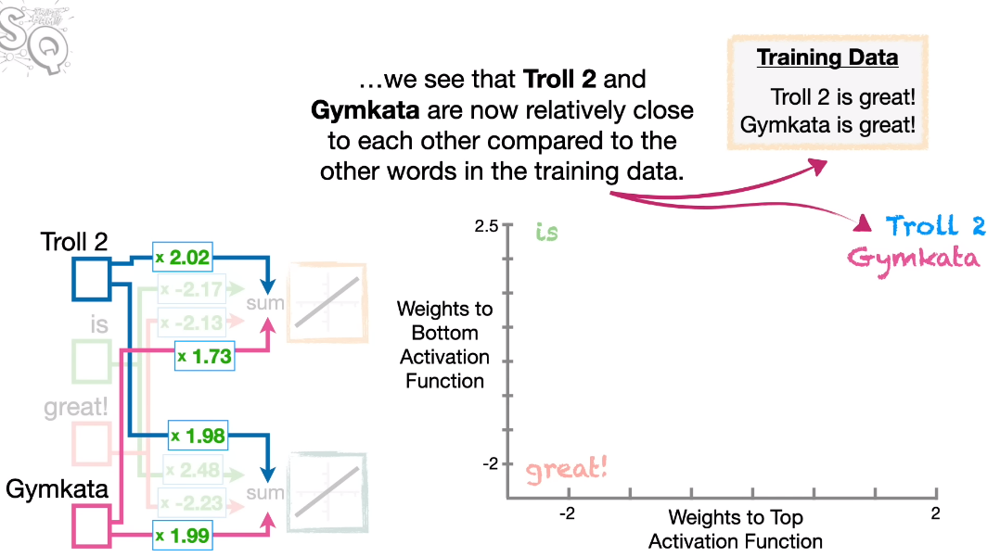


The values given to the words are random and we will use backpropogation to adjust these values.

In order to that we will predict the words based of the input to adjust the values of the prediction based in the training of
the data. So in other words if the input word is coding then we will idicate it as [1,0,0,0] and we want to predict the next word 'is' we want the output to be like [0,1,0,0].

Now lets focus on word2vec method for creating vectors, It uses 2 methods :-
1.continous bag of words: - It uses the surrounding words to predict what comes in the middle, gievn troll2 is great sentence, using troll2 and great it gives us the word "is".
2.skip gram method:- it use the middle word to predict the surrounding words, so "is"  will be used to predict teh words troll2 and great in the above given sentence.

Traing the data this way leads to make the process very slow so word2vec uses something known as Negative Sampling.
In negative sampling the word2vec will choose the words from the output that it doesn't want to predict and the original word that comes after the inout words, using this the word2vec optimizes the calculation time. In addition to this the word that we take the input we only considers its weight not the whole subset of weights.

In summary it just takes random words to predict their next words, in order for us to save time.

# Transformer Encoder

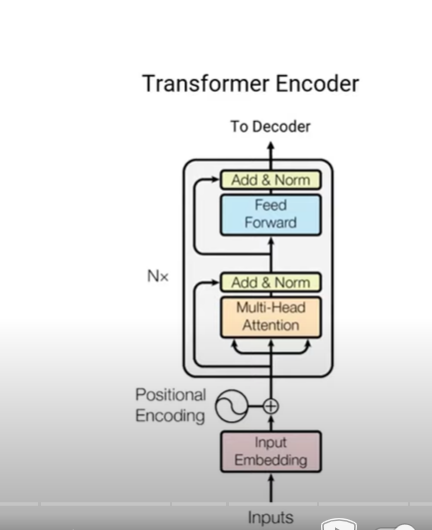

Here the inputs are a series of words that are bieng taken and converted to embeddings [Word embeddings are a way to present words in a form of the vector, so that similar words can come together]

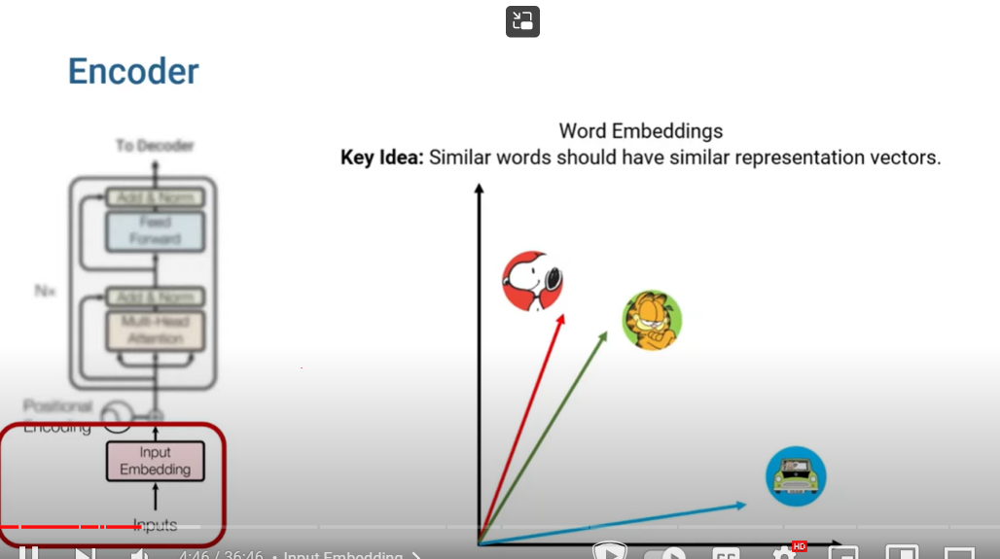

The embedding layer in the transformers produces a 512 size vector for each word.

And now we move to the positional encoding.The purpose is to add some info about the position of the words before feeding it to the encoder.

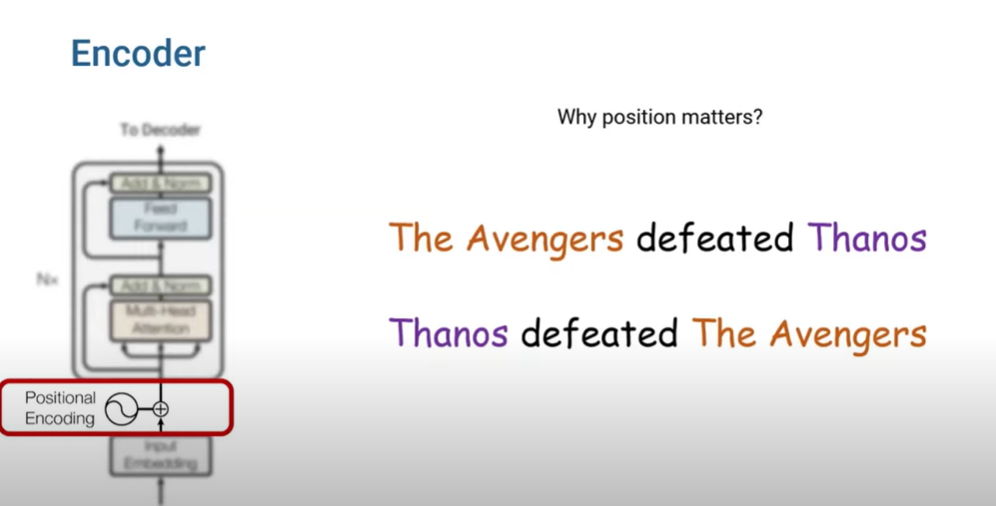

# A little about RNN VS Transformers in terms of positional encoding

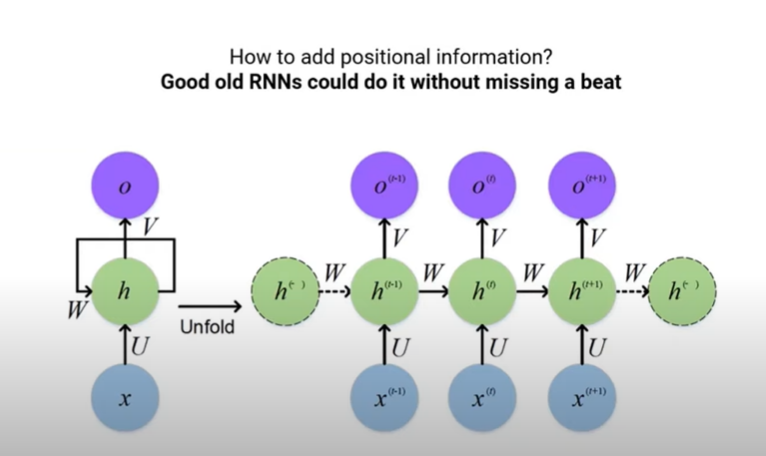

RNN inheritly takes in the account of the position of the words in the Sentence, as they pass the sentence word by word in Sequenctial manner.

IN transformers we try to add positional information by using the sum of current embedding vector with a new vector that contains some information about the position of words in the sentence.
The positional encoding we use must satisy the follwing criteria.
1.Unique encoding for each time-step
2.Consistant distance between 2 timesteps, even with sentences of different length.
3.Should generalize to longer sentences
4.Deterministic

A simple solution would be just to add a linear number to the input embeddings but it does'nt play out well with point 3.
as the values will become huge and our model will also be confronted and with sentences that are longer than those in training. Further more our model may not observe any samples of a given length, which would limit our model's generalization
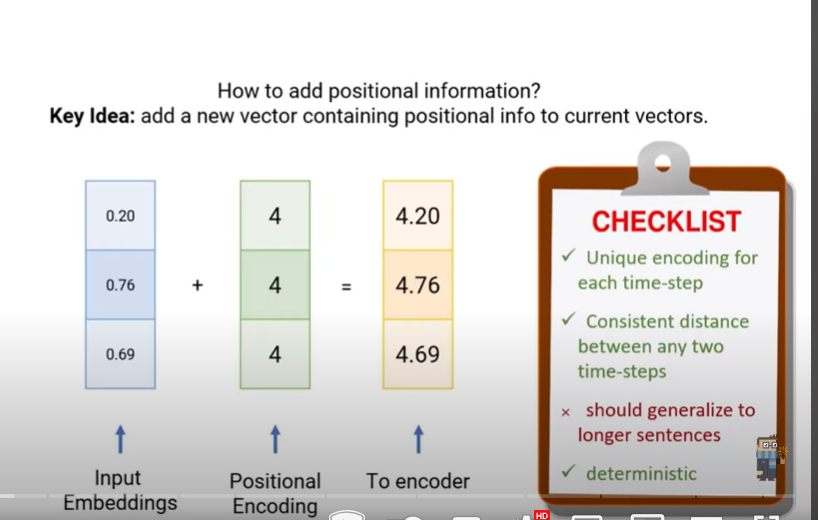

Another possiblilty is to assign a number within the range of 0 to 1. ISuues that it will cause is that inablilty to determine how many words are present in a given range, It will also casue the time-steps doesnot have a consistant meansing across the sentences.
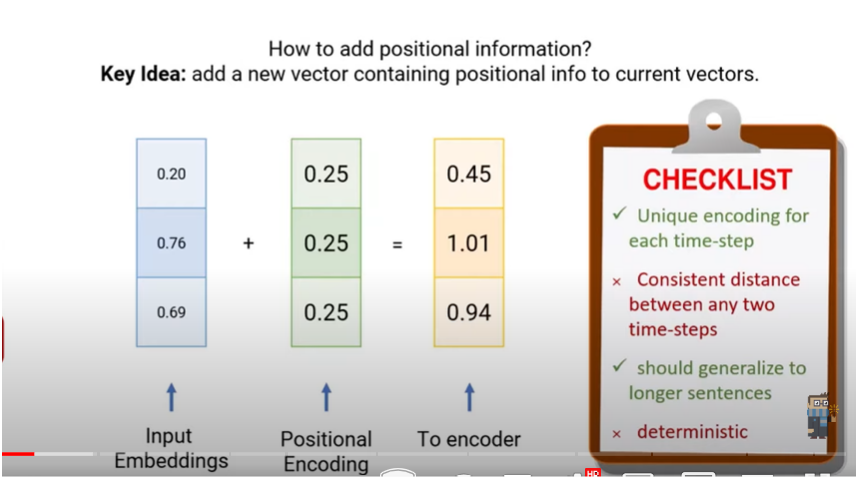


Positional Encoding suggested in the paper is: -
We will create a d- dimensional vector that contains information about a specific position of a word in a sentence.As word embedding have a 512 dimesion vector assigned to it, therefore the current model encoding dimesion will also be 512 dimensional vector alongside this the positional encoding vector dimension would also be 512 dimensions.To fill in the positions of the vector in the paper we used sinosodal function.

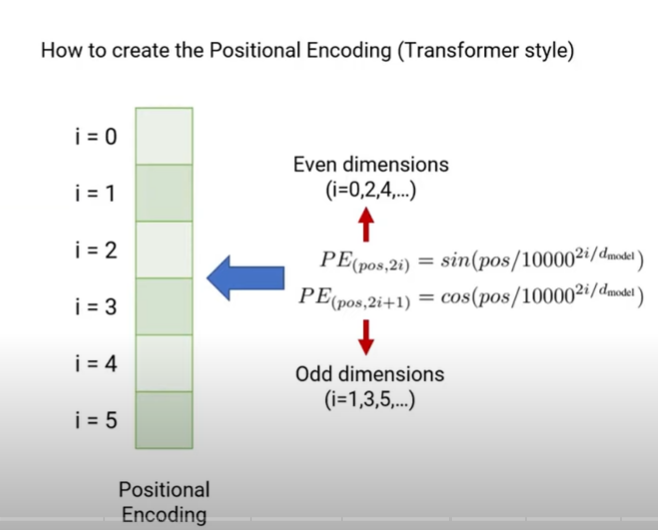

We have used 2 formulae for filling up the dimensions based on the whether the index is even or odd.

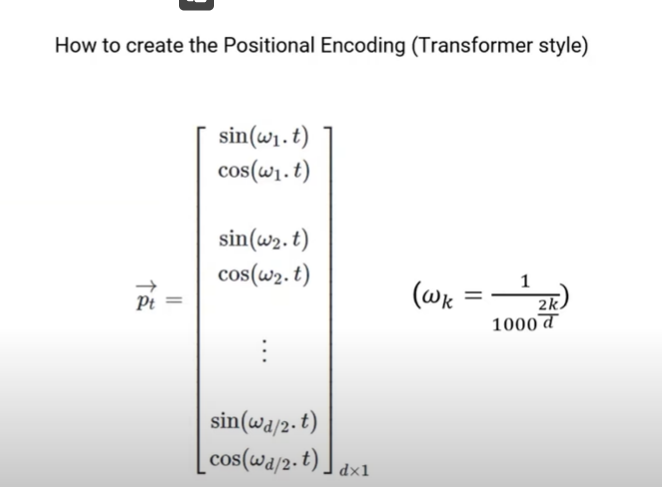

All the above mentioned steps are only for preprocessing of the data.

# Total transformer

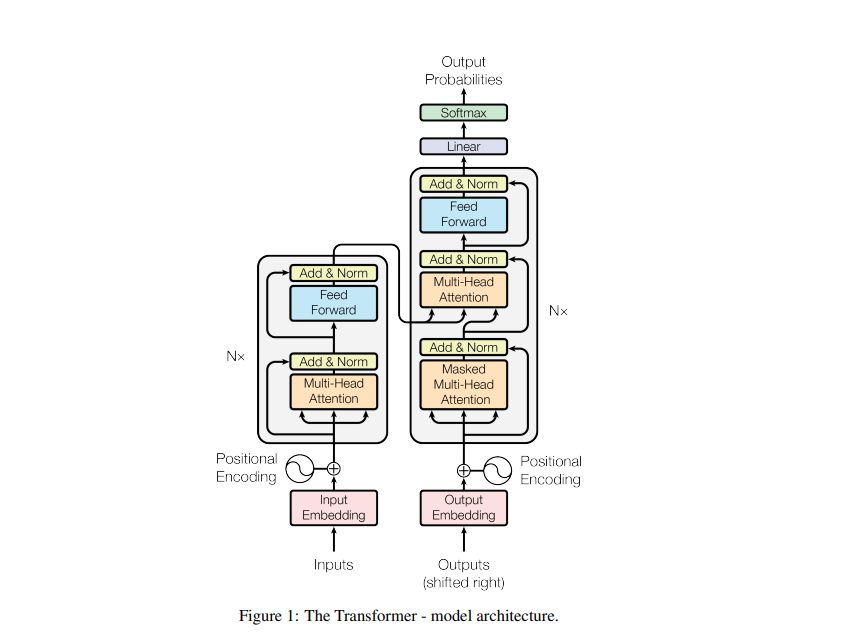


# We are now in the encoder part.......

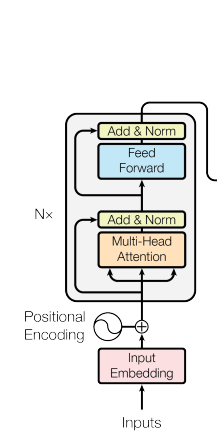

Self-Attention:-

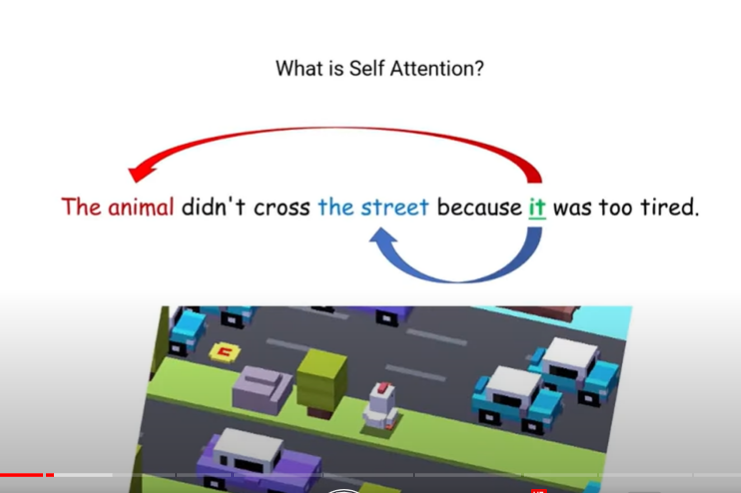

In the sentnece we stumbled upon the fact that how would a machine algo know that the word "it" is refering to animal or street.

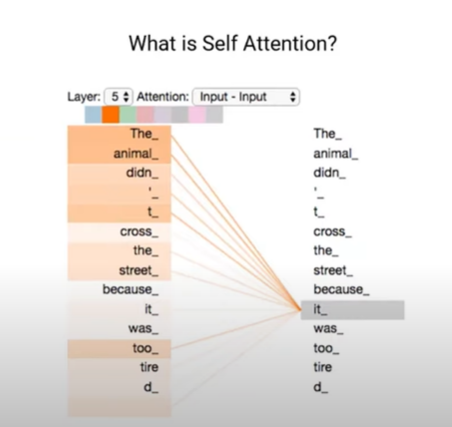

But we can see in this image that it has given a significant weight to animal using the self attention mechanism.

How does self-attention mechanism works?

We create 3 copies of the input embedding and we multiply each vector with the weight matrix, which is learned through the training process. These 3 copies will be known as query,key and value.
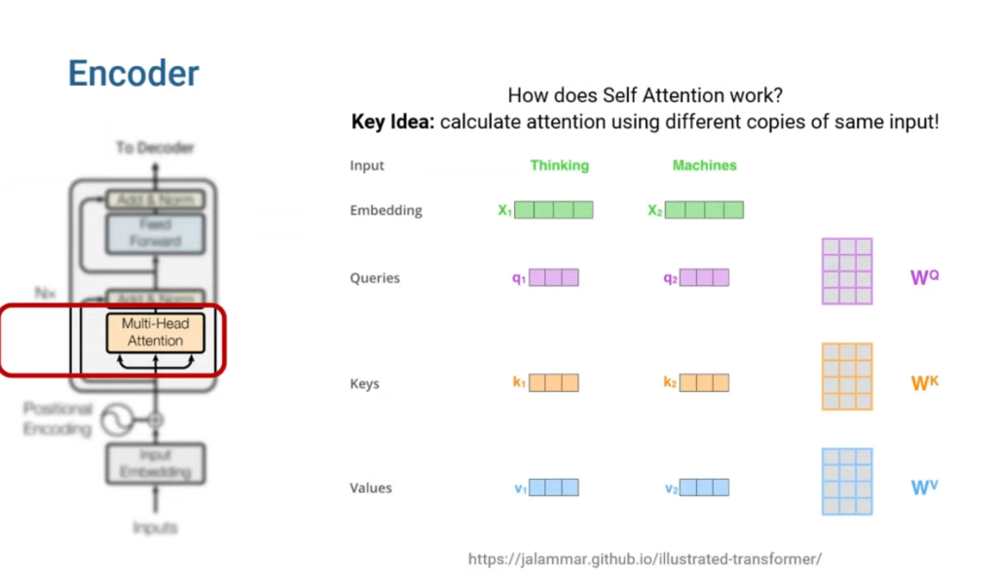

The weight matrices can be of square shaped and but in the paper the 512 dimensional input embedding was converted to 364 dimesonal input embedding after weight multiplication. We will use the query and key vectors to calculate the score. we need to score each word to the input word. for example the word is thinking then we need to find the score of each word in a sentence with this word. 
This score will decide which word to give attention to in the sentence based on the word "thinking". Then we first divide the score values with the square root of dimension of the key vector which in the paper is 64 so, we need to divide the score with 8.
Then we pass them to softmax function which normalizes it and makes the sum of all teh scores given to each word as 1.
The softmax score determines how much each word will be expressed at this position.
Next we multiply each value vector with the softmax score obtained, the goal here is to preserve the values of the word we want to focus on and fade out the other words that are irrelavant , by multiplying them with very small numbers.
The last step in the self attention is to sum up the weighted value vector and this produces the output of self attention layer for the fist word.and we send it to the next part along with the feed forward method.
In the actual paper embedding vectors of individual words are stacked on top of each other to create one matrix per sentence, so instead of vectors we end up with query,key and value matrices.

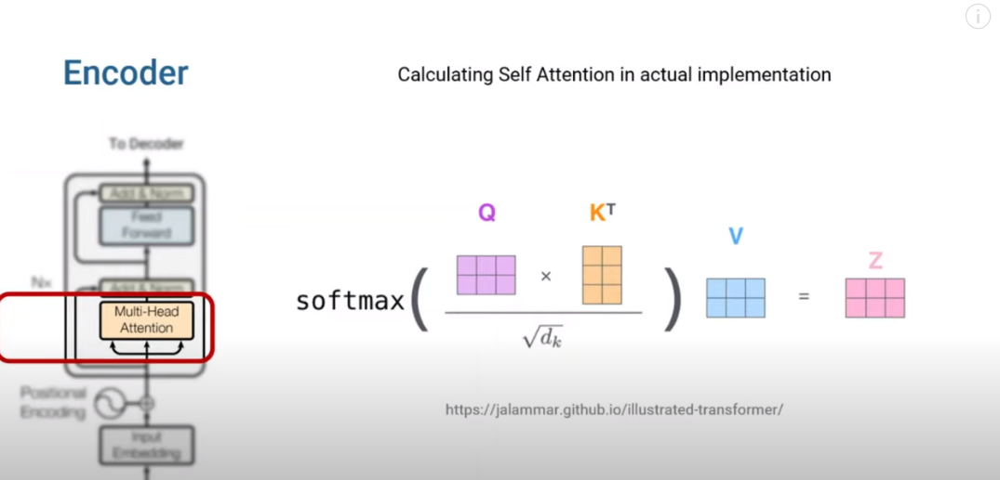

Now we move on the multihead attention part of the attention paper.

INstead of performing a single attention on keys head and query values the authors of the paper decided to project the linear keys,queries and values to 8 times with different learned linear projections. SO basically applying 8 parallel layers or head for this task.
So for each head we will maintain the weights seprately and then we will calculate the head values accordingly, basically just repeating the self attention mechanism with different wieghts 8 times to get for the same word 8 differnt values. and now the feed forward layer is not expecting 8 matrices but a single matrix and a vector for each word ina sentence.
SO we achieve a single matrix from multiple 8 matrices by multiplying them with weight matrix that was jointly trained with the model to get a single matrix.


Now we move to the ADD and NORM layer: -

So basically it simply calculates the sum of the output from the multihead attention that we calculated above alongside that it adds the input embedding vector to it. Then we subject the calculated matrix to layer normalization.

Layer Normalization: -
It helps in faster training, reducing bias and preventing weight explosions.
We use layer normalization here in the attention paper instead of batch normalization as layer one works good with NLP tasks.
Layer normalization simply means that Processing eaxh sentnce seprately and giving them weights accordingly whereas in batch normalization we see that multiple sentences are proessed for normalization.

Now we move to the feed forward:-

This consist of two linear transformations with a relu activation in between, Its genral role and purpose is to process the output from one attention layer to better fit the next attention layer."Transformer Feed-Forward Layers are key-value memories"

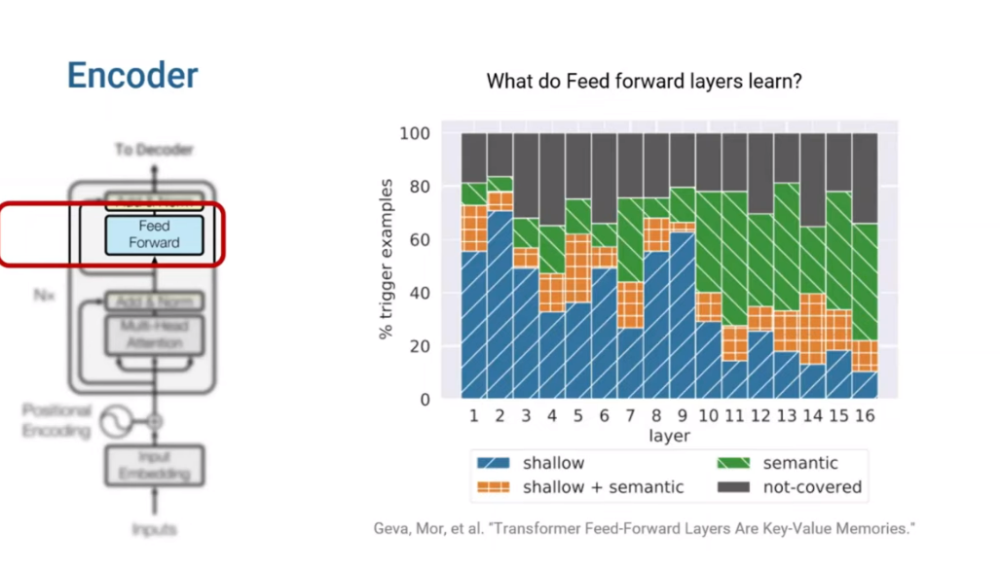

We see an example of sentences that are shallow, shallow+sematic and semantic only pattern based networks.

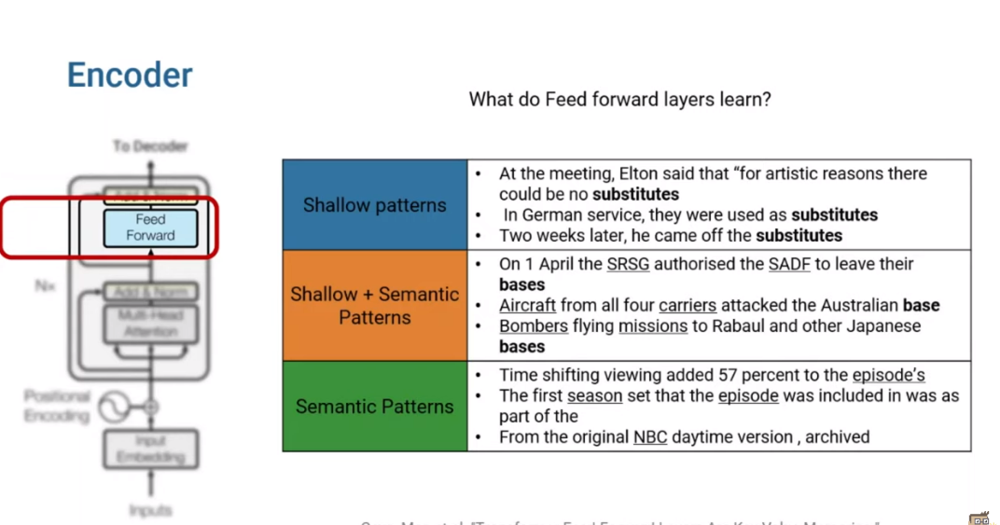

After the feed forward we again come to the add norm layer that functions the same as before.

In the paper several encoder modules were stacked in each other in paper there were 6 modules in total.

# Decoder 

The decoder takes in the processed sentence from the encoder and to predict the 1st word we give it a starting synatx like <starting token' to  start the decoder, now the decoder will predict the 1st word based of the 2 inputs that we gave it. 1st the starting index like <starting token' and the input state we got from the encoder for the next word we give like the First word the decoder predicted and the encoder given output. and so on the decoder takes in its own predicted word alongside the encoder given vector, and the decoder will keep on producing this output till it decides the end word as <end of sentence!>.

The decoder is fast and produces outputs quickly whereas the encoder takes time accordingly to produce output tokens one by one.
in the traing face.
At first we would get terrible results, but with finetuning the parameters by using the back propogation efficiently, we can get good results accordingly.
We use teacher forcing technique here to understand the model perfectly.

OK, so tp train the decoder good, we can give it a part of the sentence or the entire converted sentence to fine tune it for the task.

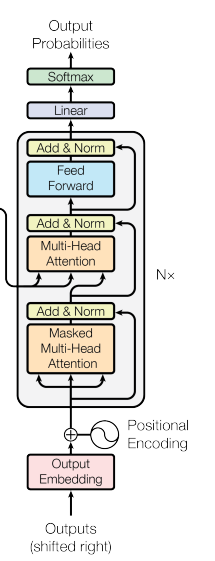

The embedding and positional encoding layers are identical to that of the encoder so we skip them.
We then encounter the masked multi-head attention,
As we are giving the entire converted sentence to the decoder then it may get overfit on the given data and therefore doesn't generalize much and may not react well to the unseen data.
So in order to prevent the decoder to overfit we use masking, for example instead of the complete output we mask some of the values of the output to let the decoder configure them out itself.

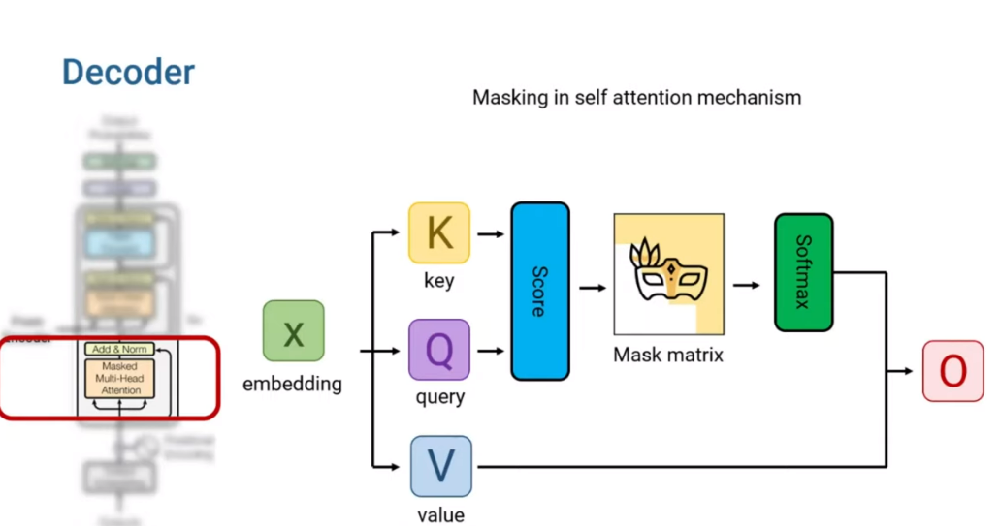

IN this attention mechanism we jsut assign a mask matrix in between.

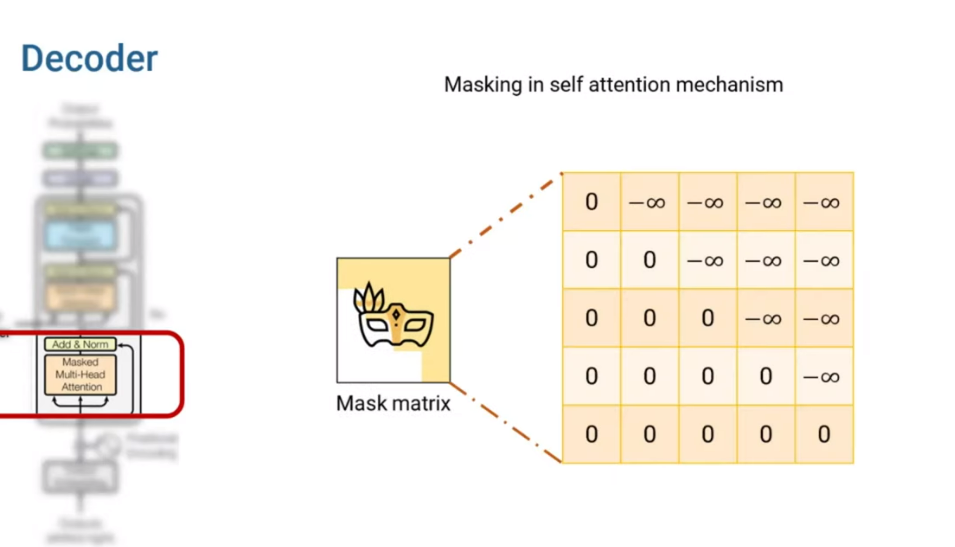

We add this mask matrix to the score matrix and this will make the softmax function to assign 0 probability to every forbidden word that will be added with (-infinty), hence the attention weight on these words be 0, SO multoyplying the ouput of the softmax with our value matrix will prevent our model from accessing the words that are not translated yet.

Then we goto another add and norm layer and then we head to another multihead attention layer where we take the input from the encoder.
As we get like two values from the encoder[key, and value] and queries from the decoder itself.
we take this output and make two copies from it through linear transformation to act as the key and value, and the decoder takes the target sentence and in the first attention layer, it produces an output and we can see in the image below.

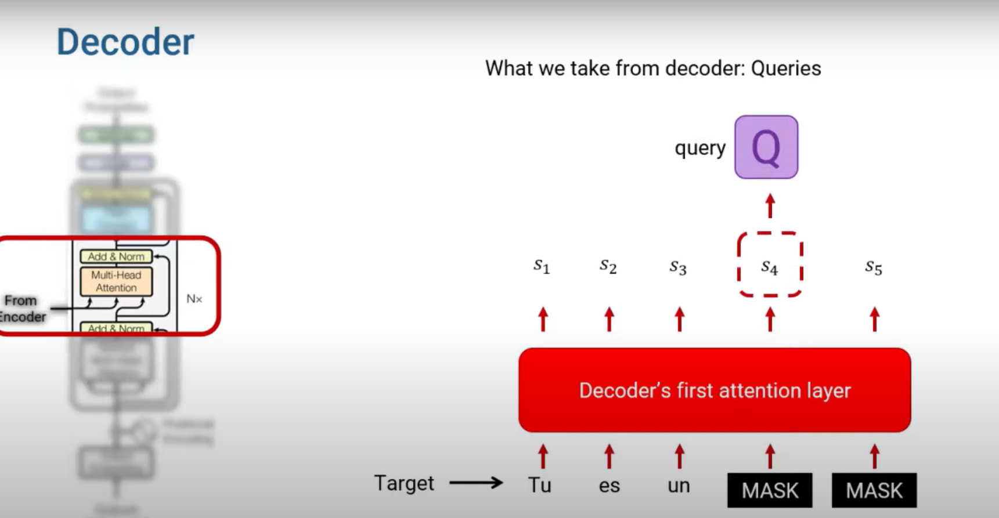

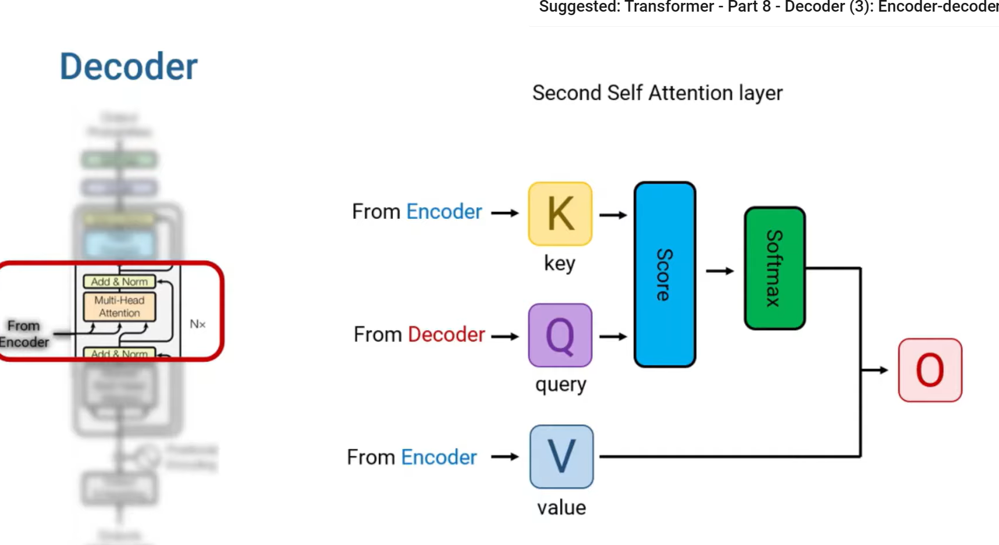

After this we see another add and norm layer and rest of the decoder will just act like as it is shown in the image and lastly we will have the output probablities.
IN the original paper 6 stacks of encoder and decoder were used to get the output. The top encoder block supplies the data to each and decoder block thereafter.




# Transformers and attention theory based of the Course.

In [1]:
# The course is not that much informative, as the instructor keeps on hiding the main things but I will be using other things to
# max out my learning of this architecture.

Self Basic Attention: -
we know from the RNN's previously specifically looking at the Seq2Seq Rnn, that we compute a hidden state known as a context vector as mentioned above, which we know as it only is a weighted sum of the hidden states computed on the hidden states from the RNN's. You can see that above in Attention in SEQ2SEQ. Because of the formulae we know that for output timestep t which input timestep t' to pay attention too, and as it is deep learning we just don't pick one timestep but we use a softselection so that gradients can pass through.
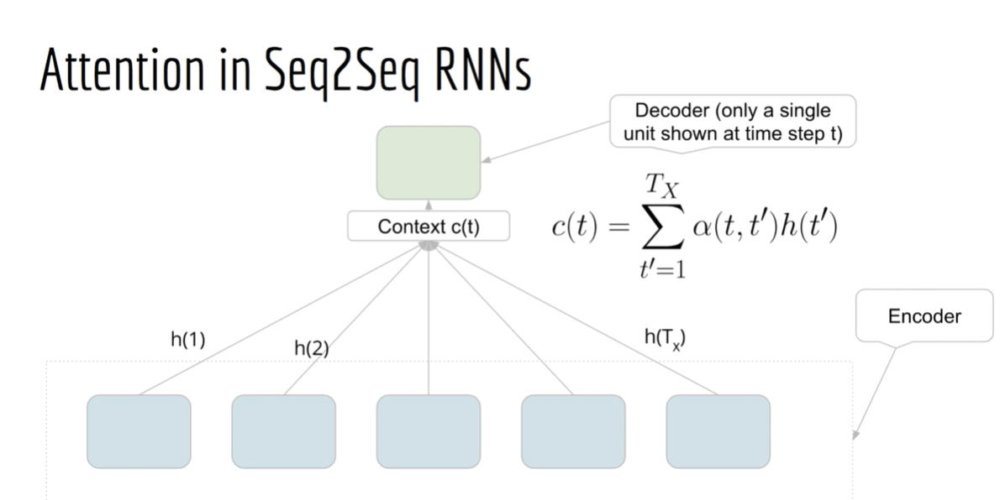

The attention mechanism in a Seq2Seq RNN model allows the decoder to dynamically focus on different parts of the input sequence at each decoding step. <span style="background-color: yellow;">This is accomplished by computing a set of attention weights that determine the relevance of each encoder hidden state to the current decoding step. The attention weights are based on the similarity between the current decoder hidden state and the encoder hidden states.</span>
To explain the above point we should look at the formulae of how exactly the attention weights and attention scores are calculated.
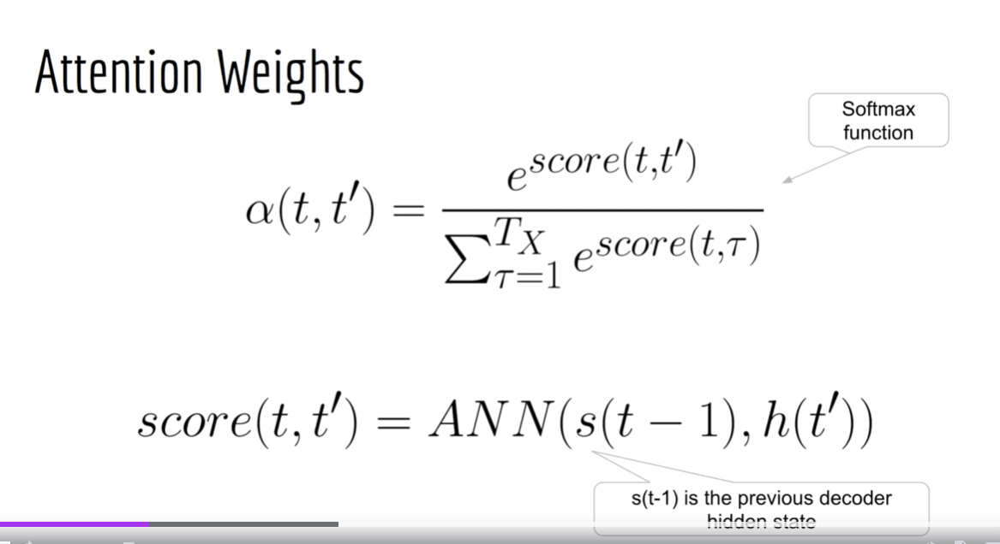

The score varibale here is just calculated as the output of the feedforward neural network taht takes as input the hidden states of the encoder and concatenates them with the previous hidden state of the decoder as (t-1).
The critical part here ofr undertsanding was that we make use of softmax to get the weights, which are nothing but probablities.

Here's how the attention mechanism works:

1. At each decoding step, the decoder computes a query vector based on the current decoder hidden state.

2. The encoder computes a set of key vectors and value vectors for each encoder hidden state. The key vectors are used to compute the attention scores, while the value vectors are used to compute the context vector.

3. The attention scores are computed as dot products between the query vector and the key vectors for each encoder hidden state. The dot product between the query vector and each key vector is computed to obtain a score, which represents the similarity between the query and key vectors.

4. The attention scores are normalized using a softmax function to obtain the attention weights. The attention weights represent the importance of each encoder hidden state to the current decoding step.

5. The context vector is obtained as a weighted sum of the value vectors, where the weights are given by the attention weights. The context vector is used as input to the decoder RNN at the current decoding step.

6. The decoder RNN outputs the next decoder hidden state and the output at the current decoding step.

Here's an example to illustrate how the attention mechanism works:

Suppose we want to translate the English sentence "I am reading a book" to French. We have a Seq2Seq RNN model with attention that has already encoded the input sequence "I am reading a book" and is now generating the output sequence in French.

At the first decoding step, the decoder computes a query vector based on the initial decoder hidden state. The attention mechanism computes a set of attention scores by taking the dot product between the query vector and the key vectors for each encoder hidden state. The attention scores measure the similarity between the query vector and each encoder hidden state.

For example, the attention mechanism might compute high attention scores for the encoder hidden states corresponding to the words "reading" and "book", because they are the most relevant words for generating the output at this decoding step.

Next, the attention scores are normalized using a softmax function to obtain the attention weights. The attention weights represent the importance of each encoder hidden state to the current decoding step.

For example, if the attention scores for the encoder hidden states corresponding to "reading" and "book" are high, then the attention weights for those encoder hidden states might also be high. This means that the decoder should focus more on those parts of the input sequence when generating the output at this decoding step.

Finally, the context vector is obtained as a weighted sum of the value vectors for the encoder hidden states, where the weights are given by the attention weights. The context vector represents the relevant parts of the input sequence for generating the output at this decoding step.

For example, the context vector might be a weighted sum of the value vectors for the encoder hidden states corresponding to "reading" and "book", because those are the most relevant parts of the input sequence for generating the output at this decoding step.

In this way, the attention mechanism allows the decoder to dynamically focus on the relevant parts of the input sequence at each decoding step, which can improve the accuracy of the translation.

# Moving to basic Self attention mechanism

It is almost like Rnn attention without the Rnn.
Lets say we have inputs from x1 to x5 and we compute a context vector which is the weighted sum of these x's, basically computing a context vector for each timestep, we have A1,A2 all the way upto A5. COnsider x here as the embedding vectors here.
Which we can map each word to vocabolary and givem them a vector representation, but these vectors are not contecxt aware as the word bank would have same representation as of the financial bank and river bank, where as the A's on the other hand are context aware embeddings, and we have one of them for each timestep. SO for each word in input sentence  we have a context aware embedding vector. 

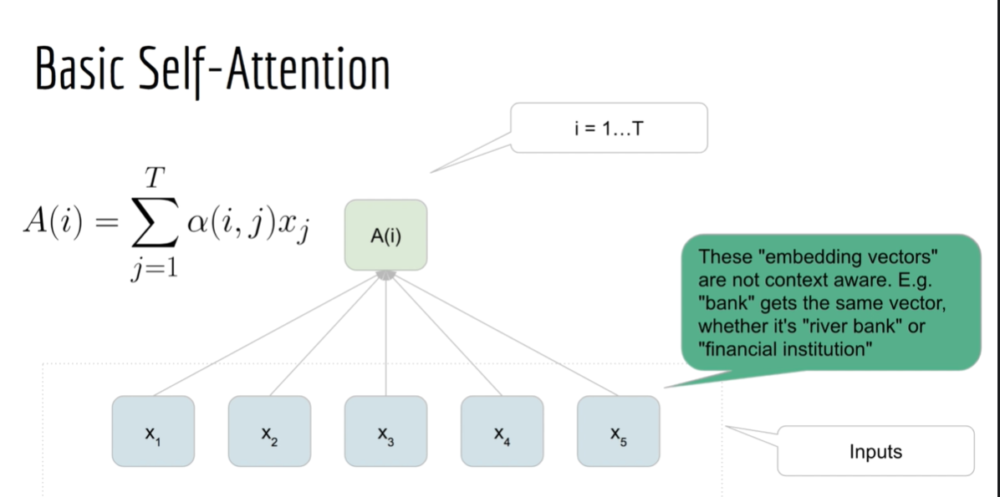

We see the formulae for calculating the attention weights to be similar to that of rnn's attention, but the question is how to calculate the alpha(i,j).
IN self attention the alpha(i,j) is easy to compute, it is just the sum of the dot products of the vectors.
The dot product is like a measure for similarity or affinity.
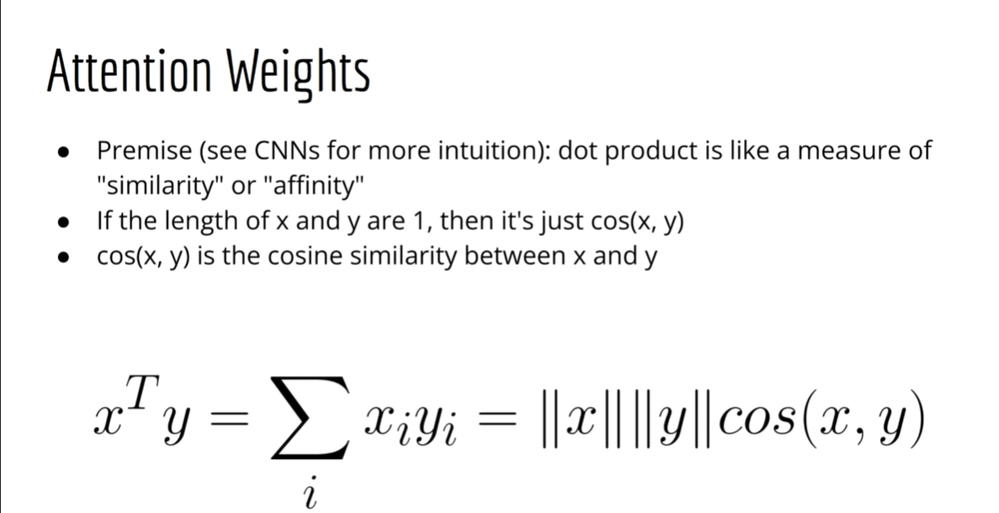

Using this formulae we can calculte the cos angle between two vectors to find if they are similar or not. Seeking in the image below we find that the pearson correlation is similar to cosine formula's as  we can see in the image below only thing that we observe is that the mean is subtracted every time from the main values in the pearson formulae.
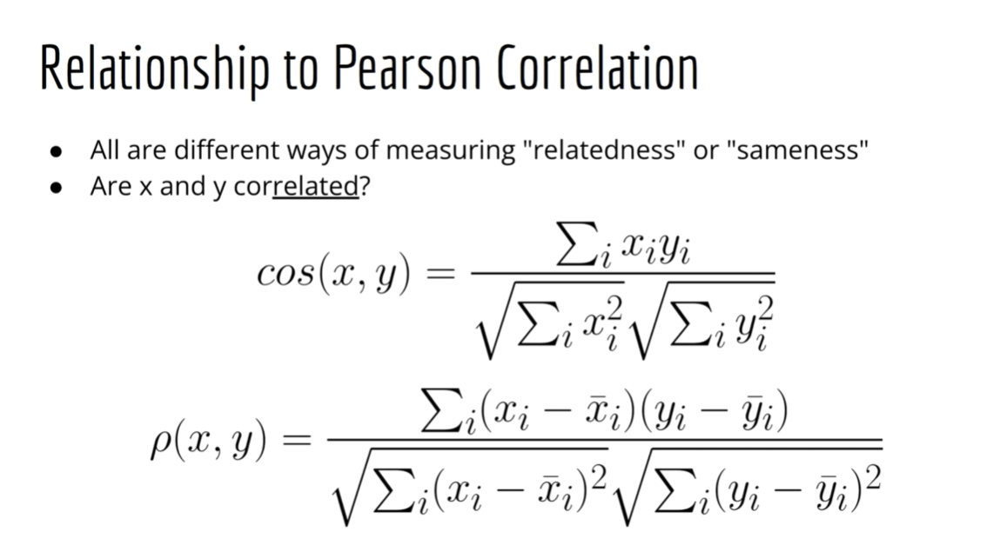

Convolution also makes a use of dot products as it is just a sliding dot product.
Using cnvolution network we can find all the features, and create a filter and looking at the filters we know what the convolution layer has found out.

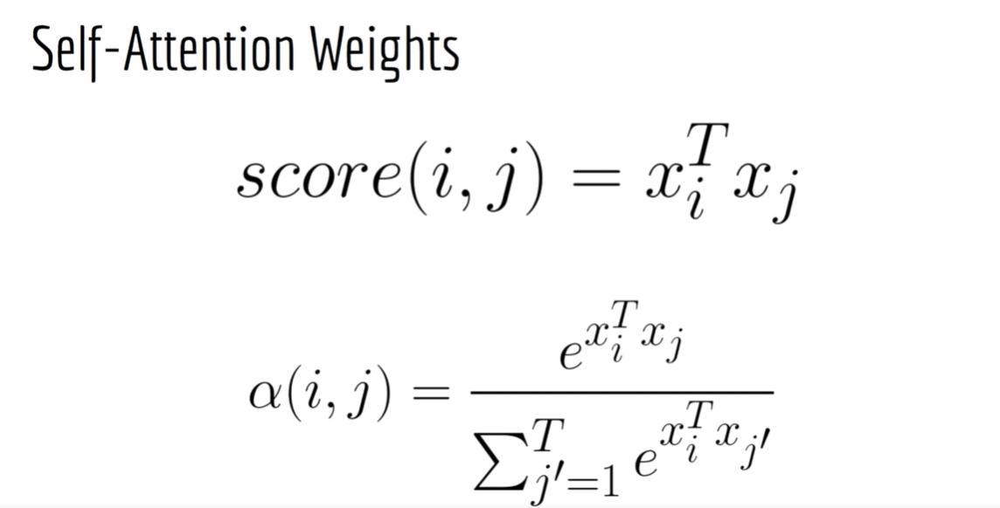

passing trough softmax ensures us that we have all teh weights from 0 to 1 range and those weights are basically probabilities.
Using this we can create a context aware embeddings from the sequence of input vectors.

# Self-attention and Scaled Dot product

Given Fixed Inputs we have fixed attention weights means that there are no learnable parameters.

Deriving the attention(q,k,v) formulae: -

we get qi=W(Q)^T*xi[it basically means that we multiply weight for query based of timestepT with the input x at same timstep and we know that these all are matrix]

ki=W(K)^T*xi

vi=W(V)^T*xi

For example: - Let's take a sentence "Bob cashed a check at the bank".
Now our attention model will try to figure out the context of the word 'check' in order to know in what sense the check word means and for this our query vector will be check and we will calculate the attention scores based of this query vector with other words in the sentence using teh above alpha(i,j) formulae wherer the xi would be qi[check] and the xj will be other words[Key vectors] in the sentence. And this way we calculate the attention scores of the word check with other words and now we will use softmax, which in turn these scores to attention weights[basically probabilities].
These attention weights are then used to form a weighted sum of the values.
So our attention vector for the word check will be the weighted sum of the value vectors.
 
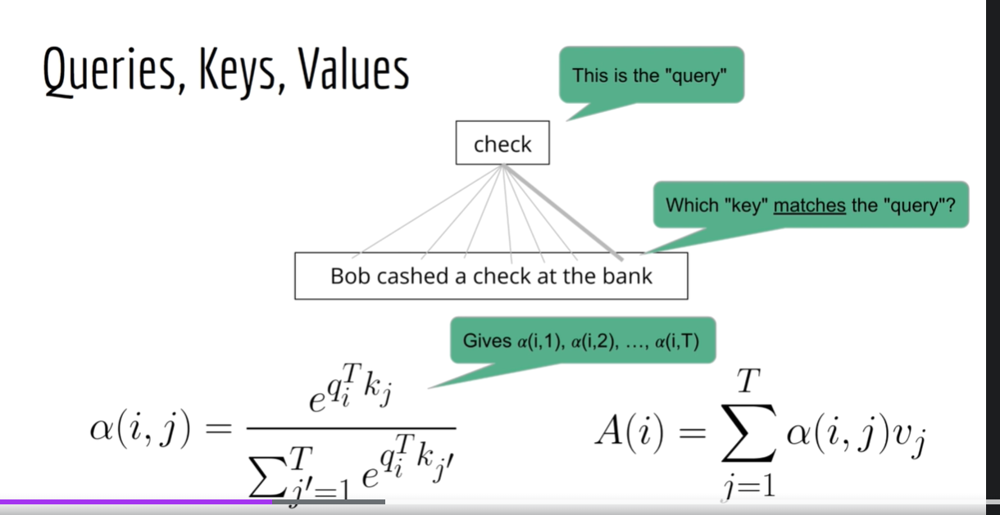

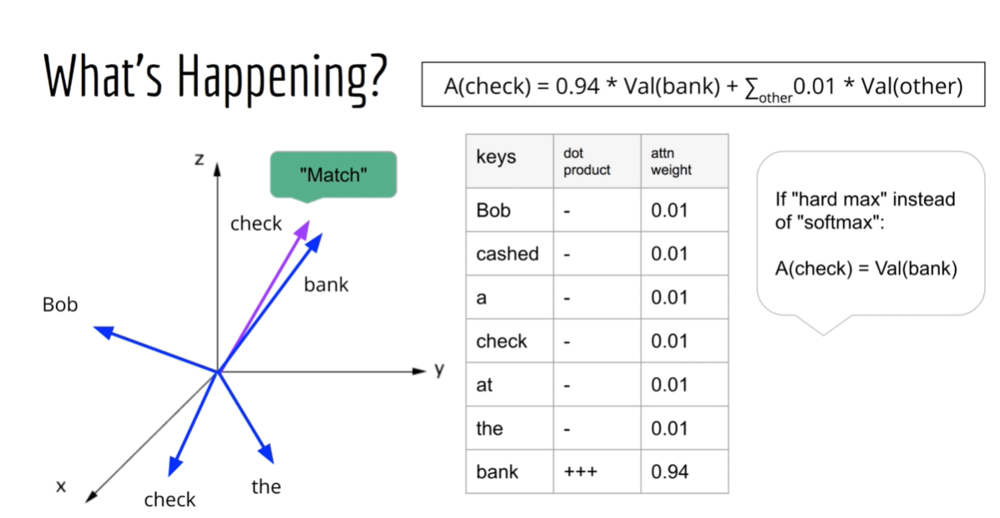

we have key vectors shown as Dark blue whereas we have query vector shown as purple. The same word can be a query and key both that's why we have check twice, In the vector space we calculate the cos angle between the two vectors using the dot product, and we get that the angle between the check and the bank comes out to be less. 

We see that the weights assigned to the words check with respect to bank is higher, beacuse the model will learn this given the relevant inputs to the model, it will try to learn this on its own, and will assign higher weights to the words like bank and check.

The only question here arisies is that why do we need to pay attention to the input sentences of the attention model? as in the Rnn's in Seq2Seq we wanted to know for each output token which input token to pay attention to.
ans:- 

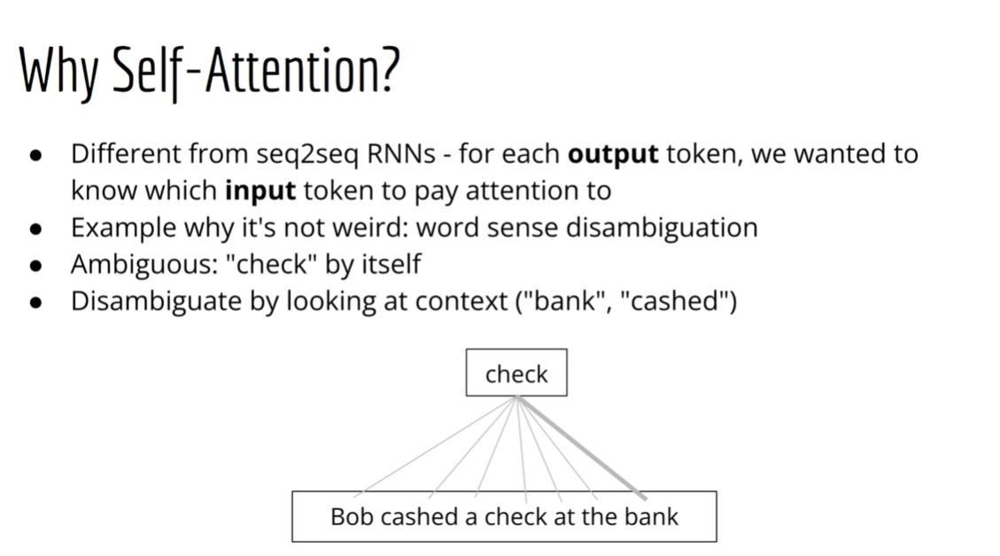

FOr this we need to know what word sense disambiguation means

Word sense disambiguation is the task of determining the correct meaning of a word in a given context, when the word has multiple possible meanings. This is a common problem in natural language processing, as many words have multiple senses or meanings depending on the context in which they are used.

For example, the word "bank" can refer to a financial institution, a river bank, or a place where a snowdrift has piled up. In the sentence "Bob cashed a check at the bank", the word "bank" could refer to a financial institution or a physical location where the check was cashed. Word sense disambiguation would involve determining the correct meaning of "bank" in this context.

There are various approaches to word sense disambiguation, including rule-based methods, knowledge-based methods, and machine learning-based methods. Rule-based methods use hand-crafted rules to determine the correct sense of a word based on the context. Knowledge-based methods use external knowledge sources such as dictionaries, thesauri, or ontologies to disambiguate the word sense. Machine learning-based methods use statistical models to learn the relationship between words and their contexts from labeled training data, and then use this knowledge to disambiguate the word sense in new contexts.

Word sense disambiguation is an important problem in natural language processing, as it is a key step towards achieving accurate understanding and interpretation of natural language text by machines.

so therefore the word check by itself is ambiguous, whereas we disambiguate by looking at context ("bank", and "cashed"), to make sense that we are talking in terms of financial institution.

This also allows the neural network to answer the questions about the input " FOR example: - Alice drove to the store". Similar to CNN's where we are try to find the features in an image like where are the eyes in a photo.

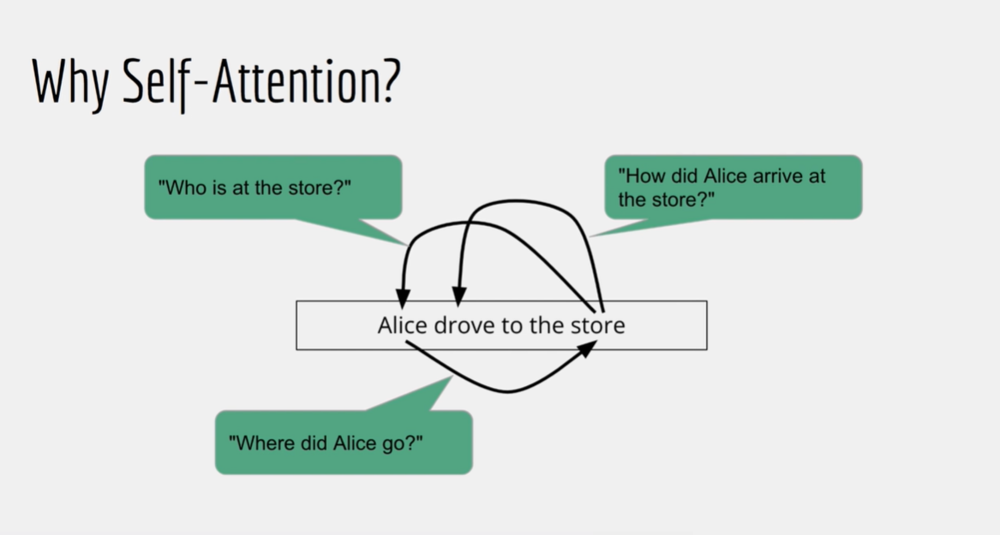

Concept of Shapes: - 

INput and output of the model have the same shapes as d,model we can see the shapes in the image below, but focusing on the shapes will be focused more when I will be coding the transformer model below.

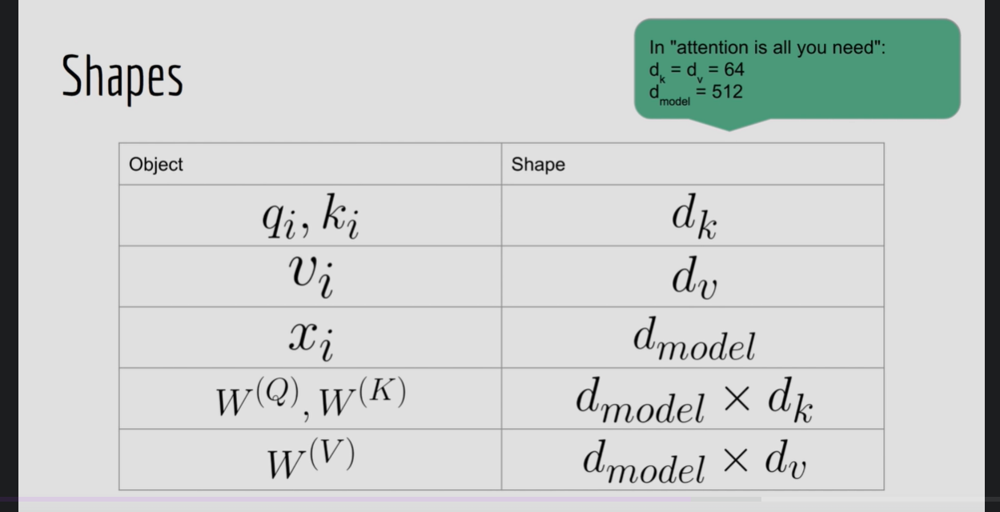                                   

xi -> W(q)Txi =qi shapes(: 512 -> (64*512) X (512*!) = 64) same happesn with key and value vectors 

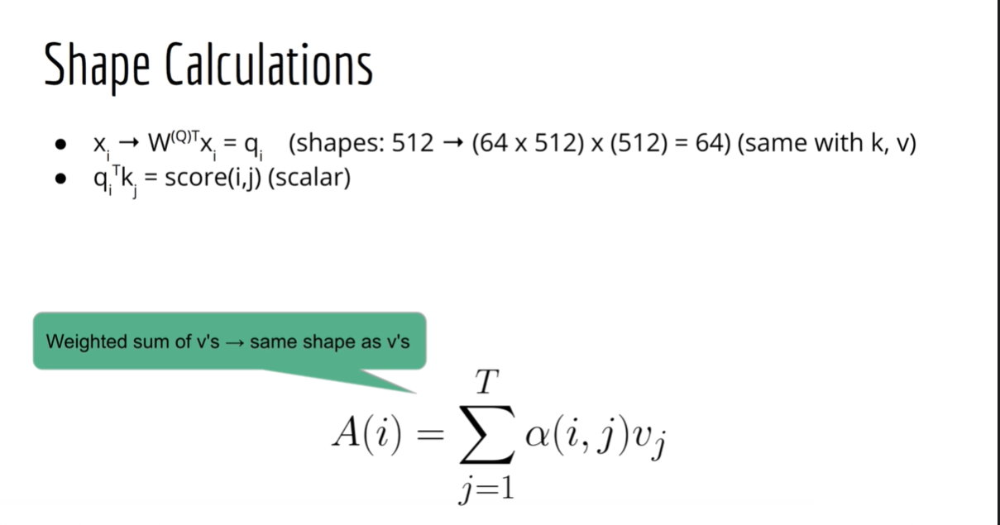

Sclaing the DOt product. 

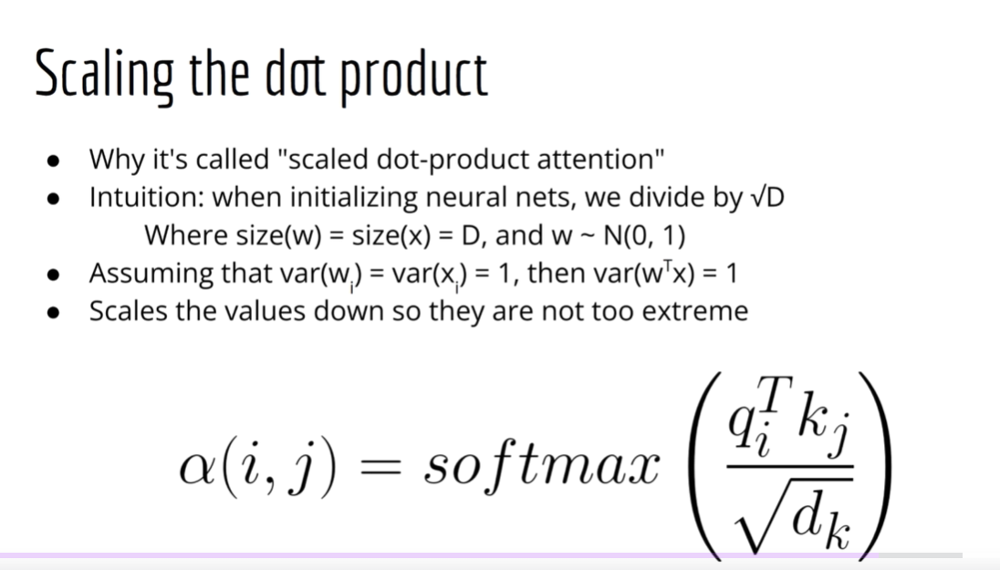

In the dot product attention mechanism used in the Transformer architecture, the scaling factor is used to ensure that the attention scores are not too small or too large. The scaling factor is typically the square root of the dimensionality of the key and query vectors, which is usually denoted as the value "d_k".

The dot product attention mechanism computes the attention scores between a query vector q and a set of key vectors K as follows:

scores = q * K^T

where "*" denotes the dot product operation and "^T" denotes the transpose operation.

The scaling factor is then applied to the scores as follows:

scores = scores / sqrt(d_k)

The purpose of this scaling is to prevent the dot product from becoming too large when the dimensionality of the key and query vectors is large. When the dot product is too large, the softmax function used to obtain the attention weights may produce very small gradients during backpropagation, which can slow down the training process or even lead to numerical instability.

By scaling the dot product with the square root of the key and query vector dimensionality, the magnitudes of the scores are reduced, making them more stable and easier to work with. This scaling factor has been found to work well in practice and is commonly used in the Transformer architecture.

Vectorize: -

General rule: Sum of element-wise products is matrix multiplication 

X: It is a feature vector for a specific time step.

The most important thing to focus here is about the shapes of the vector models that we will be using for our transformer architecture development


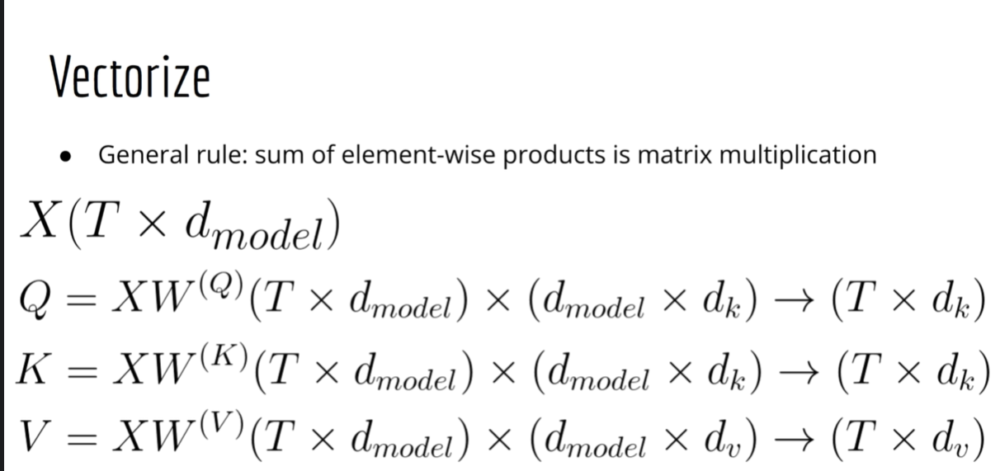

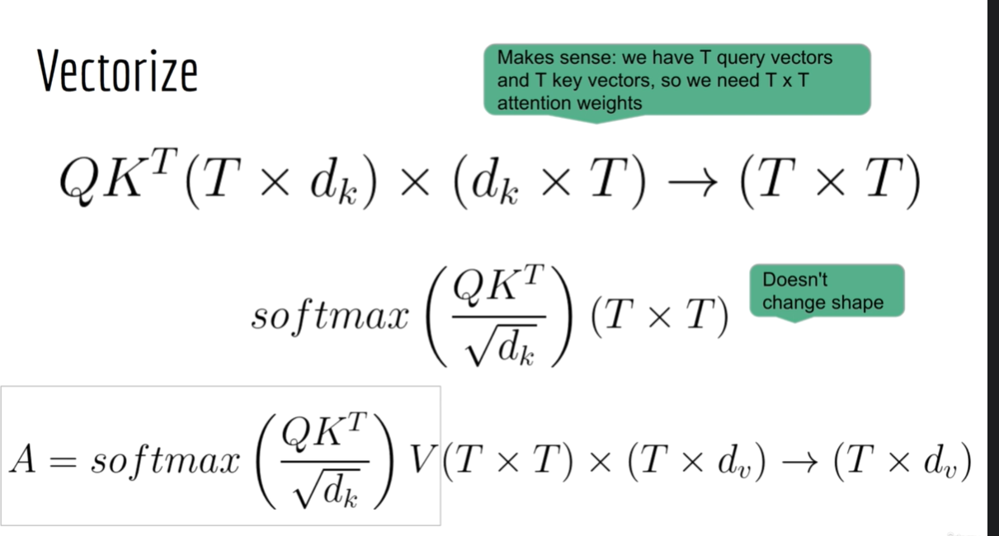

we basically mutiply each row of q with each row of v, as these row are the different query and value vectors at different time steps.

While we are coding we will have N samples at a time so everything would be N X T X D, instead of T X D.

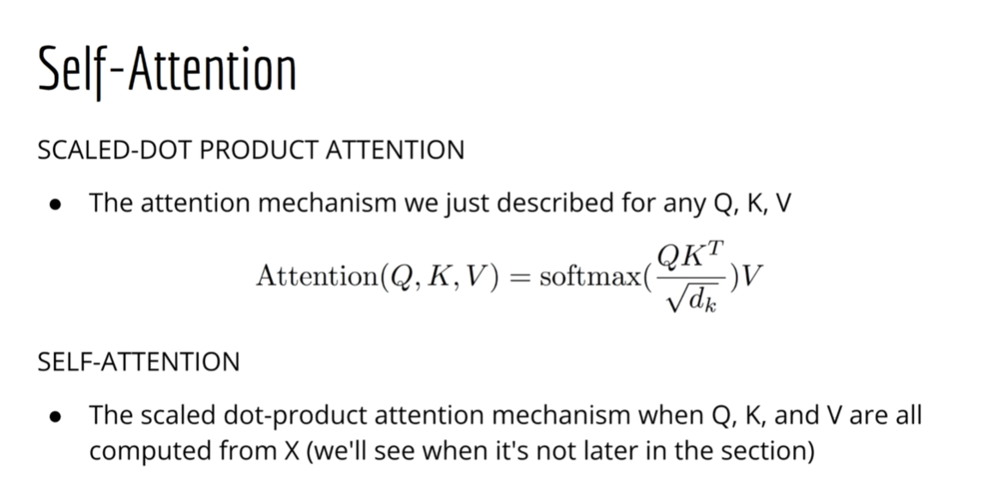


# Attention efficiency

For each word in input we pay attention to the word itself and to every other word in the sentence.

Therefore we are using a for loop therefore we if the input sequence is long we are computing a lot of attention weights for the input. For example for 10 words attention weights calculated will be 100, and this would be exponential, and shows an exponential weigh growth, therefore the number of computation that we do grow faster than the number of inputs we have, therefore we have to limit input size.

It is still superiror to Rnn. because computation of one query vector doesn't depend on the computation of another query vector unlike in RNN where we must compute h(t-1) before h(t), sicnce it depends on h(t-1).

And alongside this rnn have problems remebering the long sequences, due to vanishing gradients, Even GRU and LSTM stop performing well after a certain point is reached. 

Attention have varibale length sequences, only we have to remeber that every batch must have the same length.

# Attention Mask:-

We use padding to make all sequences in batch have the same T, where we don't pay attention to pad tokens.

Decoder training(autoregressive - current predcition only looks at the past), USing a mask we can hide all the tokens beyond a timestep

We mask the values by -infinty not with 0 as the softmax function uses exp and exp(0)=1.

We know from our calculations that Q,K,V are all calculated with only X as an input in the self attention calculations.

# Multi-Head-Attention

Why we need multi head attention: - We need it so that we can capture multiple context relationships in the sentence. consider for example where the self attention mechanism only catures the relation of every word with every other word, it might still miss to capture all the available relationships in the sentence, there fore by using muktiple attention we calculate all the other sets of weights so that different relationships can be captured in the same sentence.

In self-attention, each word in the sentence is used both as a query and a key to compute attention scores with respect to all the other words in the sentence, including itself. This allows the model to capture the relationships between each word and all the other words in the sentence.

For example, the word "quick" will attend to all the other words in the sentence, including "brown", "fox", "jumps", "over", "the", "lazy", and "dog". The attention mechanism will compute attention scores for each word with respect to all the other words in the sentence, and the output of the self-attention layer will be a weighted sum of the input word representations, where each word is weighted according to its attention score with respect to all the other words in the sentence.

However, in multi-head attention, the self-attention mechanism is performed multiple times in parallel, with different sets of learnable parameters. Each set of parameters is referred to as an attention head, and each attention head is able to capture different aspects of the relationships between the words in the sentence.

For example, one attention head might focus on capturing the relationships between the subject-verb-object triples in the sentence ("fox jumps over"), while another attention head might focus on capturing the relationships between the adjectives and nouns in the sentence ("quick brown fox", "lazy dog"). By attending to different parts of the input sequence in parallel, the model can capture more complex relationships between words and generate more accurate representations of the input sentence.

The output of the multi-head attention layer will be a concatenation of the output of each attention head, followed by a linear projection and a normalization step. This output will then be fed into the feedforward neural network layers of the Transformer model.

Of course, the exact behavior of the Transformer model will depend on the specific task it is being trained on, as well as the specific architecture and hyperparameters used. But in general, multi-head attention allows the model to attend to different aspects of the input sequence in parallel, leading to more accurate and robust models for a wide range of natural language processing tasks.

 In multi-head attention, the self-attention mechanism is performed multiple times in parallel, with different sets of learnable parameters. Each attention head computes its own set of attention scores between each word in the input sequence and all the other words in the sequence, including itself. These attention scores are then used to compute a weighted sum of the values (i.e., the input word representations) for each attention head separately.

The output of each attention head is then concatenated together along the feature dimension, resulting in a higher-dimensional representation that captures different aspects of the relationships between the words in the sequence. This concatenated output is then passed through a linear projection and a normalization step, before being fed into the feedforward neural network layers of the Transformer model.

By attending to different parts of the input sequence in parallel, using different sets of learned parameters, multi-head attention allows the model to capture more complex and nuanced relationships between the words in the input sequence. This can lead to more accurate and robust models for a wide range of natural language processing tasks, such as machine translation, text classification, and question answering.

In the paper we have computed the self attention 8 times, due to this we have 8 sets of attention scores with us, which we concatimate by the use of an output vector W(o).

we concatinate these attention scores such that we have them side by side of each other. For Example lets say that the output that we have is of [1,1] from each layer then the attention weights would be concatenated side by side like we cocatinate the columns in our ML models. 

So for 8 features  [1,1] [1,1] [1,1] [1,1] [1,1] [1,1] [1,1] [1,1] will have 1*8(2) shape as we can see in the image below.

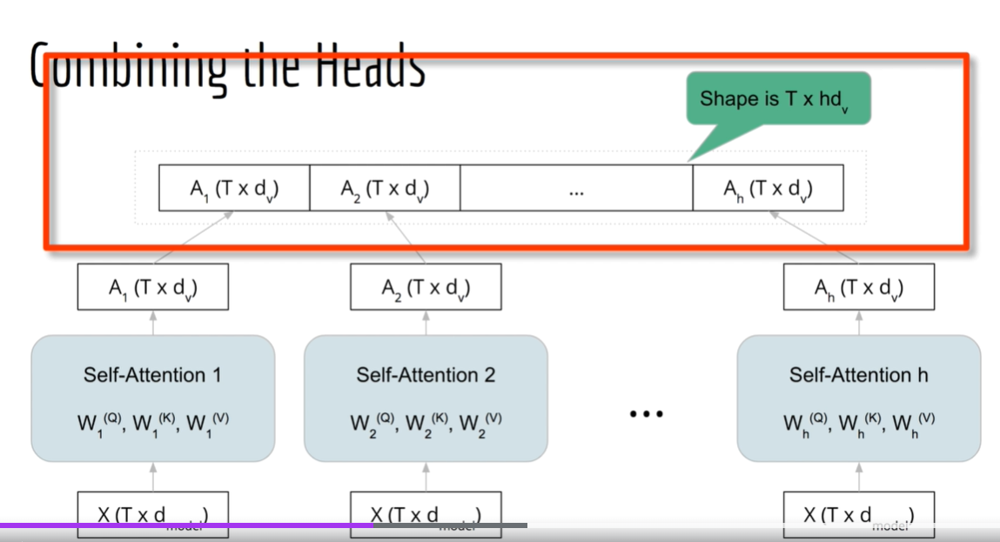


After this we project the model in its orginal dimension by mutiplying it with the W(o)[ This is another weighted learnable parameter that we can use to adjust the model this weight is what is multiplied in the linear layer.] The weights are present in the Linear layer. In  multihead attention the operations that are done are also in parallel computation.

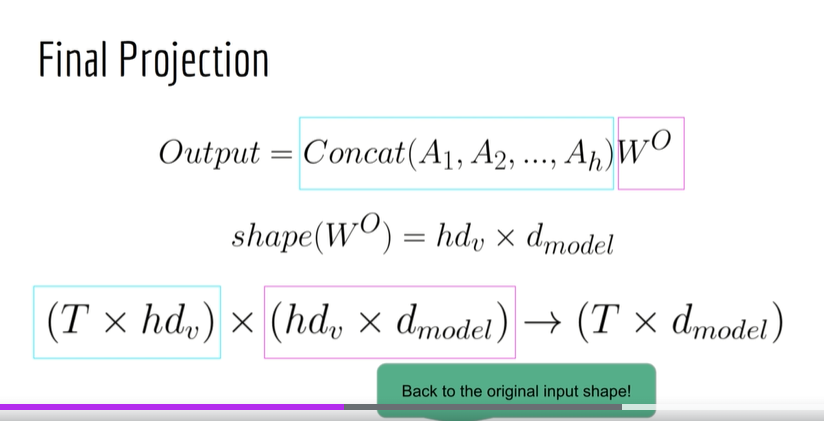

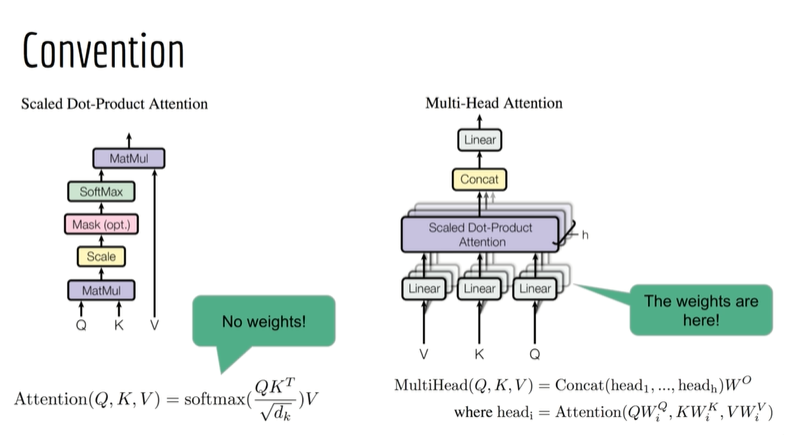

We do the self attention layer run multiple times to make this multihead attention because 1 attention layer may only catch one of the relationship in the text where there may exist multiple relationships, therefore we need to use the multihead-self-attention to capture more of the given context in a sentence.

# Transformer Block

We have lerned so far about the multihead attention, where the multihead attention is just a building block in Transformer Block. Stacking the Transformer blocks give us a transformer.

All of the models like GPT-BERT and decoder models also just use these stacking layers of the transformer models.

Multihead layers just use linear transformation and then we add a feedforward ANN layer to it with RELU activation function[GELU(Gaussian Error Linear Unit, Range is from -1 to +inf) used in BERT]. 
GELU(x) = x * P(X ≤ x), where P(X ≤ x) is the cumulative distribution function of a Gaussian distribution with mean 0 and variance 1.

Layer Normalization: - 

It appear both after the multihead and ANN, It simply means to calculate the mean and variance over the features of the dataset, where as in batch normalization, the normalization occurs over the sample of data. The adaptive gain and bias gain are both learnable parameters.

Normalization simply refers to scale the data, as if the input and output values are too large or small the performance of the model degrades because algorithm like gradient descent and other don't work, to converge the model values therefore we use Nomralization and as we can see the formulae is also similar to standard Normal.

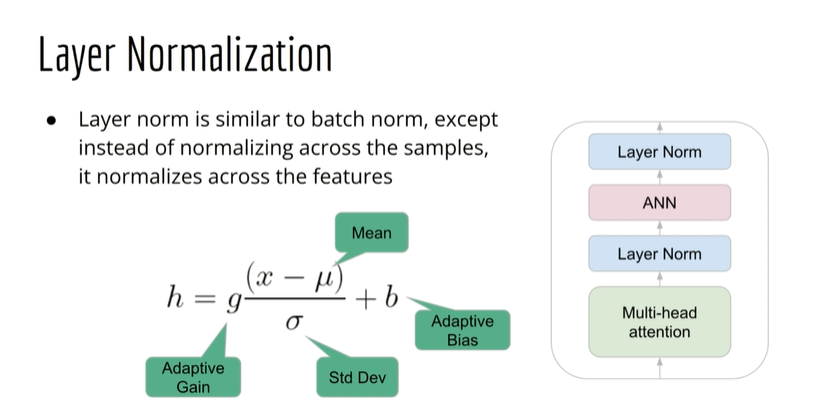


Skip connections: - also known as Residual collections that are introduced in CNN's as Resnet.

We use skip connections to remove the problem of vanishing gradient that occurs if we have a lot of layers in the neural netwrok,

In a deep neural network, as the input passes through multiple layers, the gradients can become very small (vanishing gradients) or very large (exploding gradients). This can make it difficult for the network to learn and can lead to poor performance.

Skip connections help to alleviate this problem by allowing the input from a previous layer to "skip" one or more layers and be added directly to the output of a later layer. This creates a shortcut or "residual" path that allows the gradient to flow more easily through the network, making it easier for the network to learn.[Remeber about the localized connections in the CNN's]

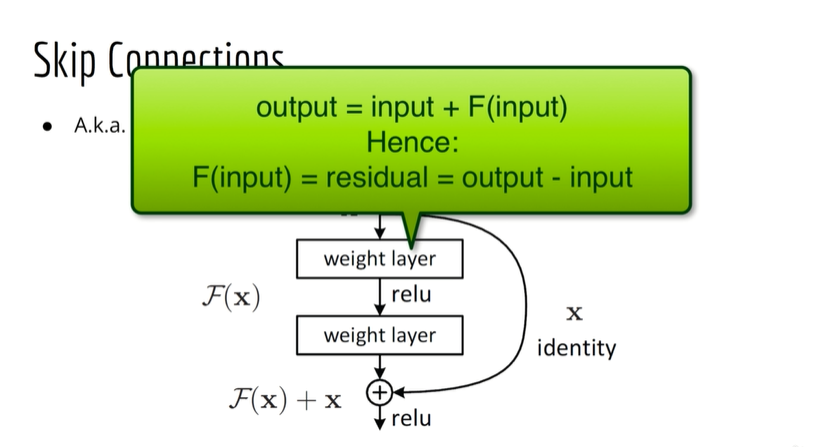

Formally, a skip connection is defined as:

output = activation(input + F(input))

where "input" is the input to a layer, "F" is a function that represents the non-linear transformation performed by one or more layers in the network, and "activation" is an activation function, such as ReLU, that is applied to the summed output.

Now just compute the entire Transformer Block: -

Starting from Multihead Attention which takes in Key, Queries and Values as the input, which comes from the same one input which is the input Layer.

After then comes the Add and Norm Block, it first add the skip connection to the output of the multihead attention block and then applies layer norm, as explained below. 

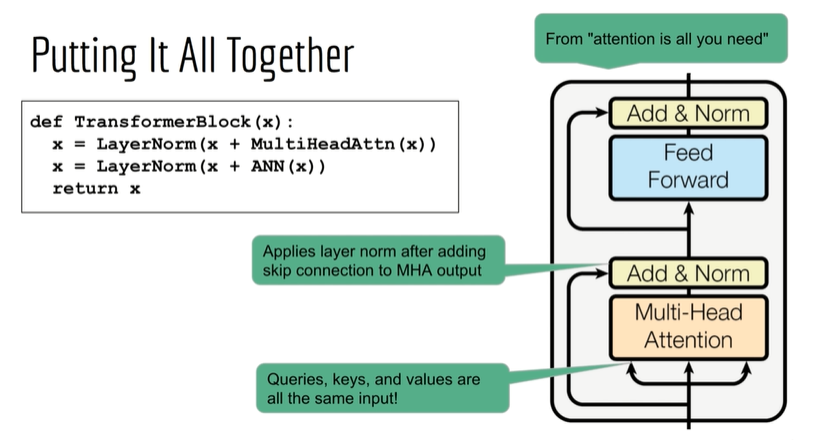

# Positional Encoding

If we pass the embedded data directly we are missing the information about the order of the data that is also necessary, above I have explained as to how the posititional encoding.

Positional encoding is a technique used in the Transformer architecture for natural language processing (NLP) to incorporate the position of words or tokens into the input embeddings. The purpose of positional encoding is to provide information about the order of the words or tokens in a sequence, which is important for understanding the meaning of a sentence or document.

The positional encoding is added to the input embeddings of the Transformer model, which are typically learned embeddings that do not contain information about the position of the words or tokens in the sequence. The positional encoding is a vector that contains information about the position of each word or token in the sequence.

The positional encoding is calculated using a mathematical function that takes as input the position of the word or token in the sequence and the dimension of the embedding. The function generates a vector of the same dimension as the input embeddings, which is added element-wise to the input embeddings.

The mathematical function used to calculate the positional encoding is as follows:

  pe_{(pos, 2i)} = sin(pos / 10000^(2i / d_model)), for even dimesions 
  
  pe_{(pos, 2i+1)} = cos(pos / 10000^(2i / d_model)), for odd dimesions 

Here, pe is the positional encoding vector, pos is the position of the word or token in the sequence, i is the index of the dimension in the embedding, and d_model is the dimension of the embedding.

This function generates a unique positional encoding vector for each position in the sequence, which is added element-wise to the input embeddings to create the final input for the Transformer model.

By incorporating positional encoding into the input embeddings, the Transformer architecture is able to effectively model the order of the words or tokens in the sequence, which is important for understanding the meaning of a sentence or document.

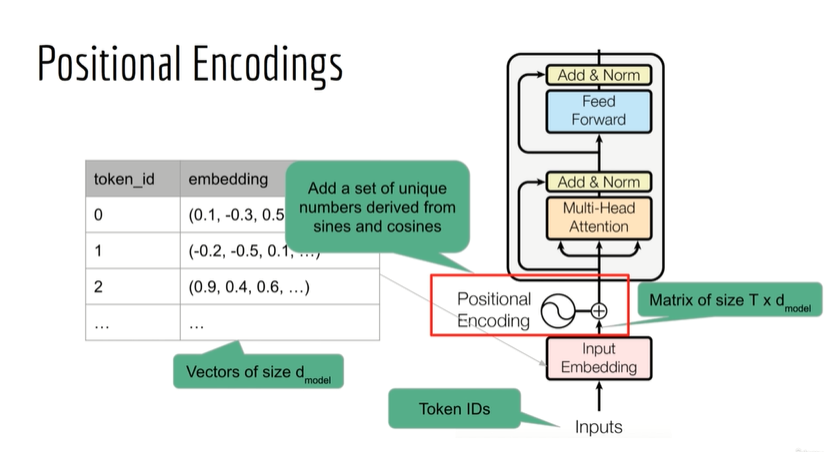

The purpose of using these encodings is such that, we are able to give unique identification to each token, as we are using Sin and cosine waves to give every word a unique encoding.

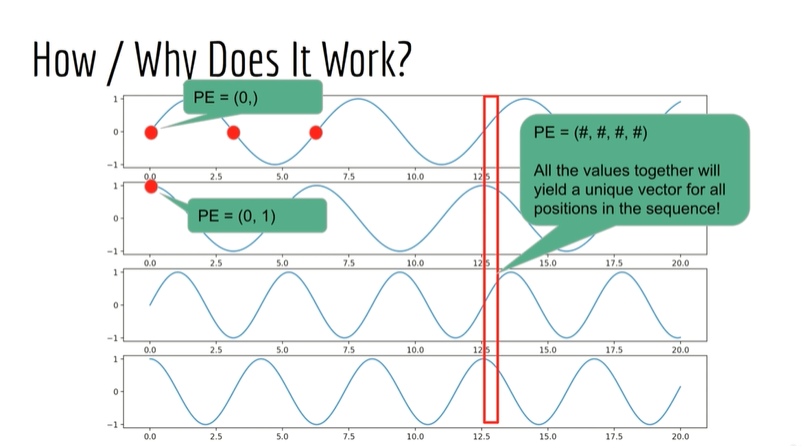

# Encoder Architecture 

Bert is an example of encoder only transformer.

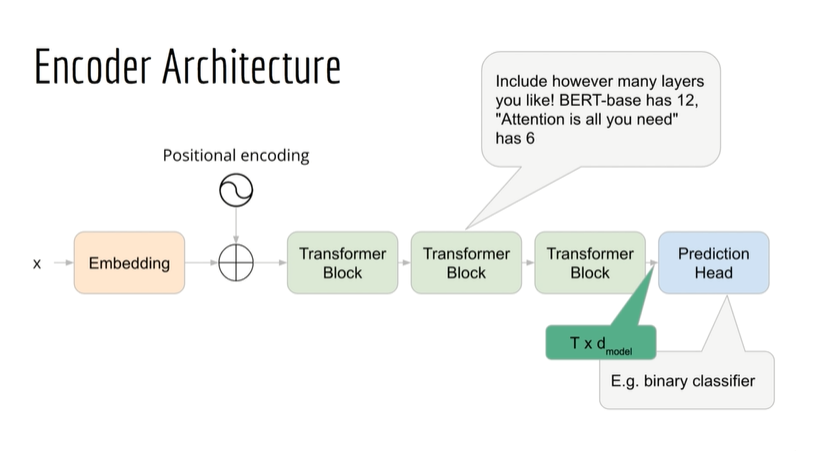


# Decoder Architecture 

The architecture is almost the same as the encoder, main challenege is how we the decoder predict the next token in the given set of inputs,

The goal of the decoder is to predict the next word given the previous words, so basically given tokens x(t-1),x(t-2)...x(1) to predict p(x(t)).

for a chatbot the encoder would process the prompt and the decoder would take encoder's output as the input.FOr language translation the encoder would process the input sentence , in both the cases after reading the encoder's output, we generate text.

The decoder only model, don't condition on input, except past token, We can still design a prompt such that the model acts as a chatbot/translator without training specifically for those tasks. this is termed as prompt engeenering.

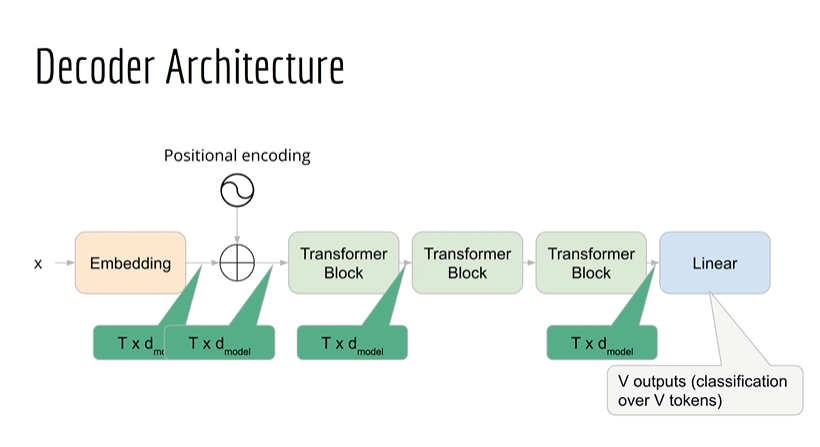

The main difference in this and the encoder model is that instead of using plain multihead attention, we use masked multihead-attention.

The main challenege here is to understand the masking that is done here, we don't want to do the masking to build a casual LM,
I have explained the reasons above as to why we need the masking in the decoder, but I am still going to explore it based on another instructor that I have here.

In the Transformer decoder model, masking is used to prevent the decoder from attending to future tokens in the input sequence during the self-attention mechanism. The masking is necessary because the Transformer architecture processes the input sequence in parallel, and the decoder has access to all the tokens in the input sequence up to the current position. Without masking, the decoder could use information from future tokens to predict the current token, which would not be available in a real-world scenario.

The masking is typically applied to the attention scores matrix, which is a matrix that represents the similarity between each position in the input sequence and each position in the output sequence during self-attention. The diagonal of this matrix is already set to negative infinity to prevent the decoder from attending to the current token during self-attention. To prevent the decoder from attending to future tokens, we set all the elements in the upper triangle of the matrix to negative infinity as well.

Setting the upper triangle of the attention scores matrix to negative infinity effectively masks the future tokens, because the softmax function used during self-attention will assign a probability of 0 to any future tokens that are masked. This prevents the decoder from overfitting to the training data by using information from future tokens that would not be available in a real-world scenario.

It's important to note that masking is only applied during the self-attention mechanism in the decoder model, not during the feedforward layer or in the encoder model. Additionally, the masking is only applied during training, not during inference, because during inference we want the decoder to use all the available information to make the best predictions possible.

In summary, masking is used in the Transformer decoder model to prevent the decoder from attending to future tokens during self-attention. This is achieved by setting the upper triangle of the attention scores matrix to negative infinity, which effectively masks the future tokens and prevents overfitting during training.

Example for masking: -

Sure, let's consider an example to illustrate the concept of future tokens in the input sequence.

Suppose we are training a Transformer model for a machine translation task, where the goal is to translate sentences from English to French. We have a training example consisting of the English sentence "I am going to the store" and its corresponding French translation "Je vais au magasin".

During training, the Transformer model receives the English sentence as input and generates the French translation one token at a time. At each time step, the model generates a probability distribution over the possible output tokens conditioned on the input sentence and the previously generated output tokens.

For example, at the first time step, the model might generate the probability distribution [0.1, 0.2, 0.3, ..., 0.0] over the possible French tokens, where the highest probability is assigned to the token "Je". At the second time step, the model generates a probability distribution over the possible French tokens conditioned on the input sentence and the previously generated output token "Je".

Now, suppose the model has generated the first two tokens of the French translation as "Je vais". At the third time step, the model is generating the next token in the output sequence, and it needs to decide which French token to generate next based on the input sentence and the previously generated output tokens.

If the model had access to future tokens in the input sequence, it might generate an incorrect output token. For example, if the model had access to the entire input sequence and saw that the next word in the English sentence is "tomorrow", it might generate the incorrect French token "demain" (which means "tomorrow" in French) instead of the correct token "au" (which means "to" in French).

To prevent this, the Transformer model applies a mask to the attention scores matrix during training, which sets the attention scores for future tokens in the input sequence to -infinity. This ensures that the model only attends to tokens in the input sequence that come before the current position, and prevents overfitting to the training data.

As from the above example we see that, if we donot apply masking then the transformers may predict wrong output's because if we allow them to look at all the outputs then it may overfit or producs outputs that may not be of the currect translation.


# Encoder-Decoder Architecture

The encoder supplies the key and va.ue parameters to the decoder whereas the encoder provides the Query vector from the masked multihead attention.
 
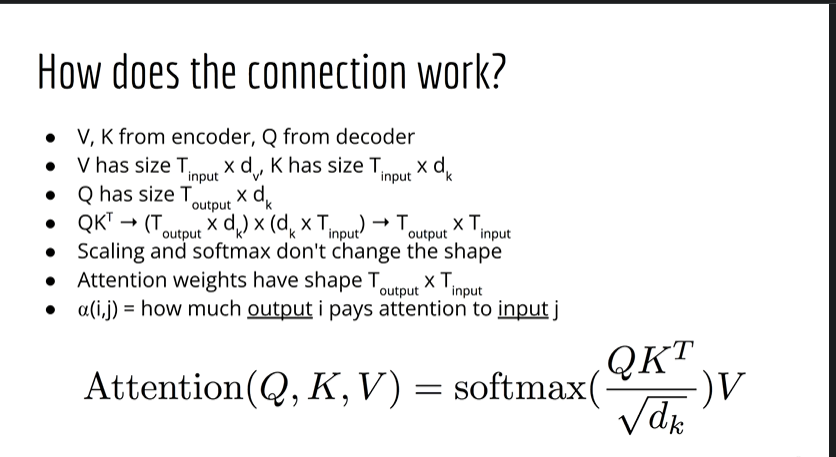

ok, inintially the encoder and decoders are stacked on each other as well, in the paper it was 6 times, this means that 6 layers of encoder decoder are there, they are all connected, such as all the enocders are stacked on each other whereas the same decoder output is then supplied to every decoder layer.

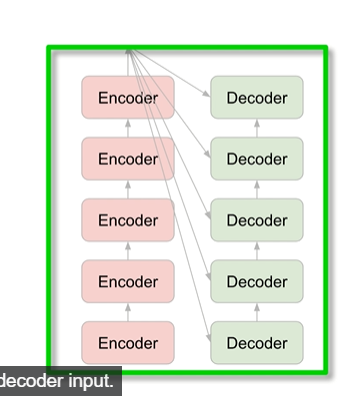

Algorithms like beam search can improve the qulaity of the output, that we may have to study.

For translation the encoder input will be the input sentence, while the decoder input would be the target sentence, shifted to the right so that it starts with the start token.
and the decoder target would be ending with an end token as shown in the image below.

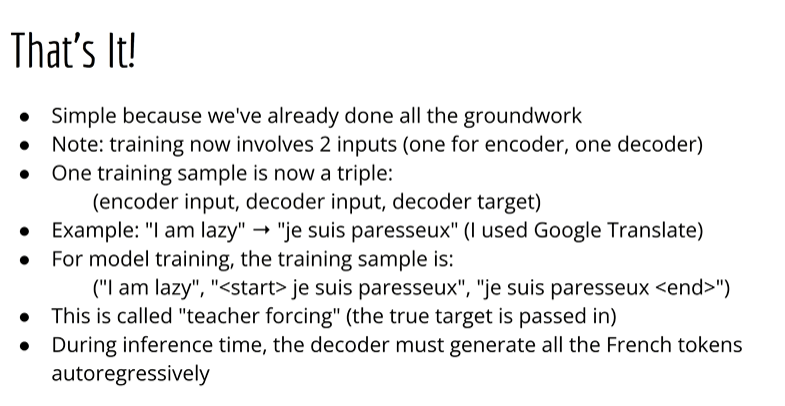

# LARGE LANGUAGE MODELS: -

### BERT MODEL: -

Bidirectional encoder representations from Transformers, It pretrained using Masked Language Modelling and Next Sentence prediction.

BERT (Bidirectional Encoder Representations from Transformers) is a pre-trained language model that uses a bidirectional architecture to learn contextualized representations of words. The bidirectional nature of BERT means that it can take into account the context of both preceding and succeeding words when encoding a given word, whereas previous models such as ELMo were only able to consider preceding context.

BERT uses a transformer-based architecture with a multi-layer bidirectional encoder, which allows it to capture contextual information from both the left and right contexts of a given word in a sentence. During pre-training, BERT is trained on large amounts of text data using two main tasks: masked language modeling (MLM) and next sentence prediction (NSP).

In the MLM task, a certain percentage of the input tokens (usually 15%) are randomly masked, out pf 15% of the selected token, there is an 80% chance that the token is bieng replaced with Mask and 10% chance that the word is replaced with random word and 10% chance of the word remaining unchanged.
and the model is trained to predict the identity of the masked tokens based on the context of the surrounding words in the sentence. By masking some of the tokens in the input sequence, the model is forced to learn to represent each word in a bidirectional context, since it must be able to predict the masked words based on both the preceding and succeeding tokens.

In the NSP task, the model is trained to predict whether two input sentences are consecutive in the original text or not. This task helps the model learn to capture the relationships between sentences, which is important for many downstream NLP tasks.even in the NSP the Masks were present there, NSp used a balanced dataset with isNext and isNot next classes given to the words.

By pre-training on a large corpus of text using these two tasks, BERT learns to encode each word in a sentence with a contextualized representation that takes into account both the preceding and succeeding context, which makes it a powerful model for a wide range of NLP tasks, including text classification, question answering, and named entity recognition, among others.

### GPT Model: -

They are only Pretrained models.

The GPT (Generative Pre-trained Transformer) model is a language model developed by OpenAI, based on the Transformer architecture. The model is trained on large amounts of text data using a self-supervised learning approach, where it is trained to predict the next word in a given sequence of words.

The original GPT model was trained on a large corpus of diverse text data, including books, articles, and web pages, using a variant of the Transformer architecture called the "decoder-only" Transformer. The decoder-only architecture is similar to the standard Transformer architecture, but it only includes the decoder module and does not include the encoder module. This means that the GPT model is only trained to generate text, not to process input data like the encoder-decoder Transformer used in tasks like machine translation.

The GPT model is pre-trained using a technique called "unsupervised pre-training" or "pre-training on a large corpus of text data", where it is trained to predict the next word in a given sequence of words. During pre-training, the model learns to capture the statistical patterns and relationships between words in the input sequence, which enables it to generate coherent and semantically meaningful text when fine-tuned for specific downstream tasks.

After pre-training, the GPT model can be fine-tuned for a wide range of downstream NLP tasks, such as text classification, question answering, and language translation, among others. During fine-tuning, the model is further trained on a smaller labeled dataset specific to the downstream task, which enables it to learn task-specific patterns and relationships between words.

The GPT model has gone through several iterations, with each new version (GPT-2, GPT-3, etc.) improving on the previous one in terms of model size, pre-training data, and performance on downstream tasks. The latest version, GPT-3, is based on a massive pre-training corpus of over 45 terabytes of text data and has over 175 billion parameters, making it one of the largest language models ever developed. It has achieved state-of-the-art performance on a wide range of NLP tasks, including language modeling, question answering, and machine translation.

Given correct formats the Gpt 2 do most of the tasks, fromats is basically what you learn in through prompt engeenring.

Other type of transformers are sparse transformer and longformer transformer 